<a href="https://colab.research.google.com/github/maraghy96/Driver_Activity_Recognation_2D-3DCNN/blob/main/Thesis_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


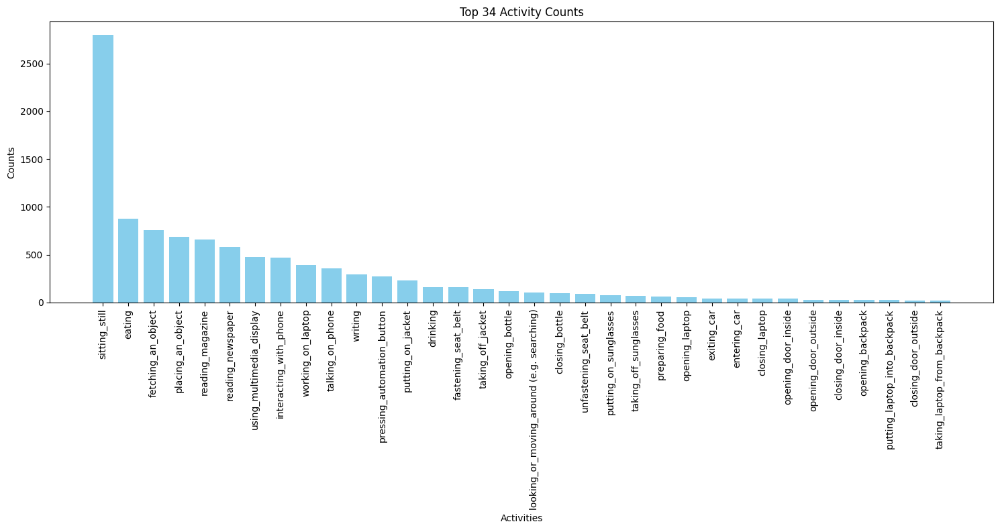

Filtered dataset with top 34 activities saved to: /content/drive/My Drive/filtered_annotations_top_34.csv


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load annotations from the CSV file
annotations_csv_path = '/content/drive/My Drive/midlevel.chunks_90.csv'
annotations_df = pd.read_csv(annotations_csv_path, delimiter=',')

# Count occurrences of each activity and keep the top 34
activity_counts = annotations_df['activity'].value_counts().head(34)

# Plotting the distribution of the top 34 activities
plt.figure(figsize=(15, 8))
plt.bar(activity_counts.index, activity_counts.values, color='skyblue')
plt.title('Top 34 Activity Counts')
plt.xlabel('Activities')
plt.ylabel('Counts')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Filter the DataFrame to keep only the rows with the top 34 activities
filtered_df = annotations_df[annotations_df['activity'].isin(activity_counts.index.tolist())]

# Save the filtered dataset to a new CSV file
filtered_annotations_path = '/content/drive/My Drive/filtered_annotations_top_34.csv'
filtered_df.to_csv(filtered_annotations_path, index=False)

print(f"Filtered dataset with top 34 activities saved to: {filtered_annotations_path}")

data_rich_activities = activity_counts.head(20).index.tolist()
support_set_activities = activity_counts.tail(14).index.tolist()

# Filter the dataframe
filtered_df = annotations_df[annotations_df['activity'].isin(data_rich_activities + support_set_activities)]

# Training data for the most frequent 20 activities
data_rich = filtered_df[filtered_df['activity'].isin(data_rich_activities)]

# Support set for the least frequent 14 activities
support_set = filtered_df[filtered_df['activity'].isin(support_set_activities)]

# Save the filtered dataset to a new CSV file
filtered_df.to_csv('/content/drive/My Drive/filtered_annotations.csv', index=False)

# Save these filtered datasets to new CSV files
data_rich.to_csv('/content/drive/My Drive/data_rich.csv', index=False)
support_set.to_csv('/content/drive/My Drive/support_set.csv', index=False)


In [ ]:
import zipfile
import os

# Replace 'path_to_zip_file.zip' with the path to the uploaded zip file in your Google Drive
zip_path = '/content/drive/My Drive/inner_mirror.zip'

# Replace 'path_to_extract' with the path where you want to extract the contents
extract_path = '/content/drive/My Drive/inner_mirror'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Extracted to {extract_path}")


In [ ]:
# Hardcoded check for a known file
test_path = '/content/drive/My Drive/inner_mirror/inner_mirror/vp3/run1b_2018-05-08-08-46-01.ids_1.mp4'
print(f"test path exists: {'Yes' if os.path.exists(hardcoded_path) else 'No'}")


test path exists: Yes


In [ ]:
from moviepy.editor import VideoFileClip
import pandas as pd



annotations_df = pd.read_csv('/content/drive/My Drive/filtered_annotations_top_34.csv')  # Update to CSV file path
base_video_folder_path = '/content/drive/My Drive/inner_mirror/inner_mirror'  # Root directory of video location
save_folder_path = '/content/drive/My Drive/inner_mirror/clips'  # Parent directory to store the output clip


def ensure_dir_exists(dir_path):
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)


for _, row in annotations_df.iterrows():
    part_file_path = row['file_id'] + '.mp4'  # Appending the video format
    base_video_path = os.path.join(base_video_folder_path, part_file_path)

    if not os.path.exists(base_video_path):
        print(f"Unable to locate {base_video_path}")
        continue  # Catapult if no off-take

    try:
        video = VideoFileClip(base_video_path)
        start_time = row['frame_start'] / 30.0  # Using 30 FPS for start time calc
        end_time = row['frame_end'] / 30.0

        # collect all clips from the same activity together
        clip_dir = os.path.join(save_folder_path, row['activity'])
        ensure_dir_exists(clip_dir)

        clip_path = os.path.join(clip_dir, f"{row['activity']}_{row['annotation_id']}.mp4")
        video_clip = video.subclip(start_time, end_time)
        video_clip.write_videofile(clip_path, codec="libx264", fps=24)  # Modifiable FPS

        print(f"Saved clip to {clip_path}")  # Loud whistle
    except Exception as e:
        print(f"Error while creating a clip: {e}")

Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4


Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_134.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_138.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_138.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_138.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_138.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_141.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_142.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_142.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_142.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_142.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_144.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_144.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_144.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_144.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4


Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4


Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_130.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_138.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_138.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_138.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_138.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_141.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_141.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_141.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_141.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_142.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_144.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_145.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_145.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_145.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_145.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_130.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_130.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_130.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_130.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_131.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_131.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_131.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_131.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_134.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_135.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_135.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_135.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_135.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_136.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_137.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_138.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_139.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_139.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_139.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_139.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_140.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_140.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_140.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_140.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_141.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_141.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_141.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_141.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_142.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_142.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_142.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_142.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_143.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_144.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_144.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_144.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_144.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_145.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_146.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_146.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_146.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_146.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_147.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_147.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_147.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_147.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_148.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_130.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_130.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_130.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_130.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_131.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_132.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_132.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_132.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_132.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_133.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_134.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_128.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_129.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_130.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_130.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_130.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_130.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_backpack/opening_backpack_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_0.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_9.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_laptop_from_backpack/taking_laptop_from_backpack_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_laptop_into_backpack/putting_laptop_into_backpack_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_51.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_90.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_95.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_102.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_117.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_outside/opening_door_outside_1.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/entering_car/entering_car_2.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_inside/closing_door_inside_3.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fastening_seat_belt/fastening_seat_belt_4.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_5.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_6.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_7.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_8.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_10.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_11.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_12.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_13.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_13.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_13.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_13.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/talking_on_phone/talking_on_phone_14.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_15.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_15.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_15.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_15.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_16.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_17.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_18.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/preparing_food/preparing_food_19.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_20.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_21.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_22.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_23.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_24.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_24.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_24.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_24.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_25.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_26.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_27.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_28.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/eating/eating_29.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/eating/eating_29.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/eating/eating_29.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/eating/eating_29.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_30.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_31.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_32.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_bottle/opening_bottle_33.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/drinking/drinking_34.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_bottle/closing_bottle_35.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_36.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_37.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_38.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_39.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_39.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_39.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_39.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_40.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_laptop/opening_laptop_41.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_42.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_43.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_44.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/working_on_laptop/working_on_laptop_45.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/interacting_with_phone/interacting_with_phone_46.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_47.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_48.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_48.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_48.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_laptop/closing_laptop_48.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_49.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_50.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_52.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_53.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_54.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_newspaper/reading_newspaper_55.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_56.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_57.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_58.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_59.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_60.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_61.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_62.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_63.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_64.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_65.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/reading_magazine/reading_magazine_66.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_67.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_68.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/writing/writing_69.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_70.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_71.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_72.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_73.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_74.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_75.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_76.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_77.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_77.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_77.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_77.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_78.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_79.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_80.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_81.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_82.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_83.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_sunglasses/taking_off_sunglasses_84.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_85.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_86.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_sunglasses/putting_on_sunglasses_87.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_88.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_89.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_91.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_92.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_93.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_94.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_96.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_97.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_97.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_97.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/looking_or_moving_around (e.g. searching)/looking_or_moving_around (e.g. searching)_97.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/fetching_an_object/fetching_an_object_98.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/putting_on_jacket/putting_on_jacket_99.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_100.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_101.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_103.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/taking_off_jacket/taking_off_jacket_104.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/placing_an_object/placing_an_object_105.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_106.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_107.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_108.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_109.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_110.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_111.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_112.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_113.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_114.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_115.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_116.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_118.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_119.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_120.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_121.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/using_multimedia_display/using_multimedia_display_122.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/sitting_still/sitting_still_123.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_124.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_124.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_124.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/pressing_automation_button/pressing_automation_button_124.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/unfastening_seat_belt/unfastening_seat_belt_125.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_126.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_126.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_126.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/opening_door_inside/opening_door_inside_126.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/exiting_car/exiting_car_127.mp4
Moviepy - Building video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_128.mp4.
Moviepy - Writing video /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_128.mp4



Moviepy - Done !
Moviepy - video ready /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_128.mp4
Saved clip to /content/drive/My Drive/inner_mirror/clips/closing_door_outside/closing_door_outside_128.mp4


**Training data preparation**

In [ ]:
import os
import random
import re
from sklearn.model_selection import KFold
import shutil

# Define the path to the main directory containing activity folders
activities_dir = '/content/drive/My Drive/inner_mirror/clips'

# List of the top 20 activities based on occurrence (replace with your actual activities)
top_20_activities = [
    'sitting_still', 'eating', 'fetching_an_object', 'placing_an_object',
    'reading_magazine', 'using_multimedia_display', 'writing',
    'pressing_automation_button', 'putting_on_jacket', 'drinking', 'fastening_seat_belt',
    'taking_off_jacket', 'looking_or_moving_around', 'opening_bottle', 'interacting_with_phone',
    'working_on_laptop', 'reading_newspaper'
]


# Create a mapping from activity names to integers
activity_to_idx = {activity: idx for idx, activity in enumerate(top_20_activities)}

# Create lists to hold file paths and labels
file_paths = []
labels = []

# Loop through each activity and collect clips
for activity in top_20_activities:
    activity_folder = os.path.join(activities_dir, activity)
    for clip in os.listdir(activity_folder):
        if clip.endswith('.mp4'):  # format of the clips
            file_paths.append(os.path.join(activity_folder, clip))
            labels.append(activity_to_idx[activity])  # Convert to integer labels

# Shuffle the dataset
combined = list(zip(file_paths, labels))
random.shuffle(combined)
file_paths, labels = zip(*combined)

# Define K-Folds cross-validator
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True)

# Function to clear contents of a directory, to make sure that there is no overlapping between training and testing
def clear_directory(directory):
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        if os.path.isfile(item_path) or os.path.islink(item_path):
            os.unlink(item_path)
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)

# Split the dataset into k consecutive folds for training and validation
for fold, (train_index, test_index) in enumerate(kf.split(combined)):
    # Create directories for the fold
    fold_train_dir = '/content/train_data'
    fold_test_dir = '/content/test_data'

    clear_directory(fold_train_dir)
    clear_directory(fold_test_dir)

    # Create directories if they don't exist
    os.makedirs(fold_train_dir, exist_ok=True)
    os.makedirs(fold_test_dir, exist_ok=True)

    # Split the data and labels into training and testing for the current fold
    train_files = [combined[i] for i in train_index]
    test_files = [combined[i] for i in test_index]

    # Copy files to the respective fold directory
    for train_file, train_label in train_files:
        shutil.copy(train_file, os.path.join(fold_train_dir, os.path.basename(train_file)))
    for test_file, test_label in test_files:
        shutil.copy(test_file, os.path.join(fold_test_dir, os.path.basename(test_file)))

    print(f"Fold {fold} prepared with {len(train_files)} training and {len(test_files)} testing files.")
#######################################################################################################################################################
# Directory containing the video files
directory = '/content/train_data'

# Pattern to find and replace in file names
pattern_to_replace = r' \(e\.g\. searching\)'

# Loop through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith('.mp4'):
        # Check if the pattern to replace is in the filename
        if re.search(pattern_to_replace, filename):
            # Generate the new filename by replacing the pattern with an empty string
            new_filename = re.sub(pattern_to_replace, '', filename)
            # Full paths
            old_file_path = os.path.join(directory, filename)
            new_file_path = os.path.join(directory, new_filename)
            # Rename the file
            os.rename(old_file_path, new_file_path)
            print(f"Renamed '{filename}' to '{new_filename}'")
######################################################################################################################################################

# Directory containing the video files
directory = '/content/test_data'

# Pattern to find and replace in file names
pattern_to_replace = r' \(e\.g\. searching\)'

# Loop through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith('.mp4'):
        # Check if the pattern to replace is in the filename
        if re.search(pattern_to_replace, filename):
            # Generate the new filename by replacing the pattern with an empty string
            new_filename = re.sub(pattern_to_replace, '', filename)
            # Full paths
            old_file_path = os.path.join(directory, filename)
            new_file_path = os.path.join(directory, new_filename)
            # Rename the file
            os.rename(old_file_path, new_file_path)
            print(f"Renamed '{filename}' to '{new_filename}'")


Fold 0 prepared with 872 training and 218 testing files.
Fold 1 prepared with 872 training and 218 testing files.
Fold 2 prepared with 872 training and 218 testing files.
Fold 3 prepared with 872 training and 218 testing files.
Fold 4 prepared with 872 training and 218 testing files.
Renamed 'looking_or_moving_around (e.g. searching)_39.mp4' to 'looking_or_moving_around_39.mp4'
Renamed 'looking_or_moving_around (e.g. searching)_12.mp4' to 'looking_or_moving_around_12.mp4'
Renamed 'looking_or_moving_around (e.g. searching)_11.mp4' to 'looking_or_moving_around_11.mp4'
Renamed 'looking_or_moving_around (e.g. searching)_13.mp4' to 'looking_or_moving_around_13.mp4'
Renamed 'looking_or_moving_around (e.g. searching)_87.mp4' to 'looking_or_moving_around_87.mp4'
Renamed 'looking_or_moving_around (e.g. searching)_31.mp4' to 'looking_or_moving_around_31.mp4'
Renamed 'looking_or_moving_around (e.g. searching)_139.mp4' to 'looking_or_moving_around_139.mp4'
Renamed 'looking_or_moving_around (e.g. s

In [ ]:
import cv2
import os

def calculate_average_frames(video_directory):
    frame_counts = []
    video_files = [f for f in os.listdir(video_directory) if f.endswith('.mp4')]

    for video_file in video_files:
        cap = cv2.VideoCapture(os.path.join(video_directory, video_file))
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        frame_counts.append(frame_count)
        cap.release()

    average_frames = sum(frame_counts) / len(frame_counts)
    return average_frames

video_directory = '/content/support'
average_frames = calculate_average_frames(video_directory)
print(f"Average frames per video: {average_frames}")


FileNotFoundError: [Errno 2] No such file or directory: '/content/support'

In [ ]:
import os

# Set CUDA_LAUNCH_BLOCKING to 1 for debugging
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"


In [ ]:
import os
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'max_split_size_mb:25'


In [ ]:
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import re
import torch
import numpy as np
from torchvision import transforms
from PIL import Image

class VideoDataset(Dataset):
    def __init__(self, directory, transform=None, target_frames=30,model_type='3DCNN'):
        self.directory = directory
        self.transform = transform
        self.target_frames = target_frames
        self.model_type = model_type
        self.videos = [os.path.join(directory, x) for x in os.listdir(directory) if x.endswith('.mp4')]
        self.labels = []

        # Modified regex pattern to match additional characters
        pattern = r"([a-zA-Z_]+)(?: \(.*\))?_\d+\.mp4"
        # Mapping from activity names to integers
        activity_to_idx = {
            'sitting_still': 0, 'eating': 1, 'fetching_an_object': 2, 'placing_an_object': 3,
            'reading_magazine':4, 'using_multimedia_display':5, 'writing': 6,
            'pressing_automation_button': 7, 'putting_on_jacket': 8, 'drinking': 9, 'fastening_seat_belt': 10,
            'taking_off_jacket': 11, 'looking_or_moving_around': 12, 'opening_bottle': 13, 'interacting_with_phone': 14,
            'working_on_laptop': 15,'reading_newspaper' : 16,

        }

        # Use regex to extract the activity name and convert it to an integer index
        for x in self.videos:
            match = re.match(pattern, os.path.basename(x))
            if match is not None:
                activity_name = match.group(1)
                # Append the integer index that corresponds to the activity name
                self.labels.append(activity_to_idx[activity_name])
            else:
                # Handle unexpected filename formats if necessary
                raise ValueError(f"Filename {x} does not match expected pattern.")
        self.label_to_index = {label: index for index, label in enumerate(sorted(set(self.labels)))}

    def __len__(self):
        return len(self.videos)

    def __getitem__(self, idx):
        if self.model_type == '2DCNN':
          video_path = self.videos[idx]
          label_index = self.label_to_index[self.labels[idx]]
          transformed_frames = []
          frames = self.load_video(video_path, self.target_frames)
          for frame in frames:
                if self.transform:
                    transformed_frame = self.transform(frame)
                else:
                    transformed_frame = transforms.ToTensor()(frame)  # Convert frame to tensor if no transform specified
                transformed_frames.append(transformed_frame)

            # Option 1: Return a single frame for 2DCNN (choose a frame, e.g., middle frame)
            # return transformed_frames[len(transformed_frames) // 2], label_index

            # Option 2: Return all frames as a stacked tensor for processing as a sequence (if your 2DCNN handles sequences)
          return torch.stack(transformed_frames), label_index

        elif self.model_type == '3DCNN':
            video_path = self.videos[idx]
            frames = self.load_video(video_path, self.target_frames)

            if self.transform:
                frames = [self.transform(frame) for frame in frames]

            frames_tensor = torch.stack(frames)  # Should be [depth, height, width]
            ##frames_tensor = frames_tensor.unsqueeze(1)  # Add channel dim: [depth, channels, height, width]
            pass
        label_index = self.label_to_index[self.labels[idx]]
        return frames_tensor, label_index


    def load_video(self, video_path, target_frames):
        cap = cv2.VideoCapture(video_path)
        frames = []
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        frame_indices = np.linspace(0, frame_count - 1, target_frames, dtype=np.int64)
        for frame_idx in range(frame_count):
            ret, frame = cap.read()
            if not ret:
                break
            if frame_idx in frame_indices:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                frame = Image.fromarray(frame)
                frames.append(frame)
        cap.release()
        # Pad frames if necessary
        while len(frames) < target_frames:
            padding_frame = Image.fromarray(np.zeros((224, 224), dtype=np.uint8))
            frames.append(padding_frame)
        return frames

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Simple3DCNN(nn.Module):
    def __init__(self, num_classes):
        super(Simple3DCNN, self).__init__()
        self.conv1 = nn.Conv3d(1, 32, kernel_size=5, padding=1)  # Initialy kernel was 3 and 64 instead of 32
        self.bn1 = nn.BatchNorm3d(32)
        self.pool = nn.MaxPool3d(2)
        #self.conv2 = nn.Conv3d(32, 128, kernel_size=1, padding=1)

        self.conv2 = nn.Conv3d(32, 64, kernel_size=5, padding=1)
        self.bn2 = nn.BatchNorm3d(64)

        # Update the following line based on the actual output size
        #self.fc1 = nn.Linear(64 * 4 * 56 * 56, 256)
        self.fc1 = nn.Linear(1119744, 256)
        self.dropout = nn.Dropout(p=0.4)
        self.fc2 = nn.Linear(256, num_classes) #number of neurons in the last layer
        # Calculate the correct number of flattened features from the output of the last conv layer
        # Assuming the output of the last pooling layer is [batch_size, 128, depth, height, width]
        # You will need to update the following line based on the actual size of the output from the last pooling layer
       # self.fc1 = nn.Linear(128 * 4 * 56 * 56, 512)
        #self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))

        # Flatten the tensor for the linear layer
        x = x.view(x.size(0), -1)  # Flatten all dimensions except the batch
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [ ]:
import time
from tqdm import tqdm
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=None):
    since = time.time()

    val_acc_history = []
    best_acc = 0.0
    num_classes = 17
    confusion_matrix_total = torch.zeros(num_classes, num_classes, dtype=torch.int64)

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            optimizer.zero_grad()


            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase], desc=f'Epoch {epoch+1} {phase} Progress'):


                # If the number of dimensions is 6, the permute call will fail.
                # Check if the number of dimensions is 5 before permuting.
                if inputs.dim() == 5:
                    inputs = inputs.permute(0, 2, 1, 3, 4)  # Adjusting the dimensions

                else:
                    print("Unexpected number of dimensions in the input tensor.")

                inputs = inputs.to(device)
                labels = labels.to(device)
                #print(f"Input shape: {inputs.shape}")
                # Zero the parameter gradients
                optimizer.zero_grad()
                # Confirming the range and type of labels


                # Confirming the range of labels is within [0, num_classes-1]
                num_classes = 19  # Change this to your actual number of classes
                if labels.min() < 0 or labels.max() >= num_classes:
                    print(f"Error: Labels out of range. Should be 0 to {num_classes-1}")
                    break  # Remove this line if you want to continue despite the error

                # Assuming outputs is the model's predictions
                outputs = model(inputs)
                # Forward
                # Track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                      outputs = model(inputs)
                      loss = criterion(outputs, labels)

                      _, preds = torch.max(outputs, 1)
                      for t, p in zip(labels.view(-1), preds.view(-1)):
                          confusion_matrix_total[t.long(), p.long()] += 1
                      loss.backward()
                      optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = (running_corrects.double() / len(dataloaders[phase].dataset) ) *100

            print('{} Loss: {:.4f} Acc: {:.4f} % '.format(phase, epoch_loss, epoch_acc))

            # Deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                val_acc_history.append(epoch_acc)
                if confusion_matrix_total is None:
                    confusion_matrix_total = confusion_matrix(labels.cpu().numpy(), preds.cpu().numpy())
                else:
                    confusion_matrix_total += confusion_matrix(labels.cpu().numpy(), preds.cpu().numpy())

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    return model, val_acc_history, confusion_matrix_total


In [ ]:
import time
from tqdm import tqdm
import torch

def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=None, num_classes=17):
    since = time.time()

    val_acc_history = []
    best_acc = 0.0
    confusion_matrix_total = torch.zeros(num_classes, num_classes, dtype=torch.int64)

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase], desc=f'Epoch {epoch+1} {phase} Progress'):

                # If the number of dimensions is 6, the permute call will fail.
                # Check if the number of dimensions is 5 before permuting.
                if inputs.dim() == 5:
                    inputs = inputs.permute(0, 2, 1, 3, 4)  # Adjusting the dimensions
                else:
                    print("Unexpected number of dimensions in the input tensor.")

                inputs = inputs.to(device)
                labels = labels.to(device)

                # Confirming the range of labels is within [0, num_classes-1]
                if labels.min() < 0 or labels.max() >= num_classes:
                    print(f"Error: Labels out of range. Should be 0 to {num_classes-1}")
                    continue  # Skip this batch

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        optimizer.zero_grad()  # Zero gradients after updating

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # Update confusion matrix for each batch
                for t, p in zip(labels.view(-1), preds.view(-1)):
                    confusion_matrix_total[t.long(), p.long()] += 1

            # Epoch statistics
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = (running_corrects.double() / len(dataloaders[phase].dataset)) * 100

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}%')

            # Copy the best model and update validation history
            if phase == 'val':
                val_acc_history.append(epoch_acc)
                if epoch_acc > best_acc:
                    best_acc = epoch_acc

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    return model, val_acc_history, confusion_matrix_total


In [ ]:
import numpy as np
import torch
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model(model, dataloader, criterion, device=None):
    model.eval()  # Set the model to evaluation mode
    running_loss = 0.0
    running_corrects = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            # Reorder the dimensions of the input to have channels as the second dimension
            inputs = inputs.permute(0, 2, 1, 3, 4)

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

            all_preds.extend(preds.view(-1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    total_loss = running_loss / len(dataloader.dataset)
    total_acc = running_corrects.double() / len(dataloader.dataset)

    # Compute the confusion matrix
    unique_labels = sorted(set(all_labels + all_preds))
    cm = confusion_matrix(all_labels, all_preds, labels=unique_labels)
    accuracy = accuracy_score(all_labels, all_preds)

    # Normalize the confusion matrix by row
    with np.errstate(all='ignore'):  # Ignore division by zero
        cm_normalized = np.nan_to_num(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis])

    plt.figure(figsize=(20, 20))  # Increased figure size for better readability
    sns.heatmap(cm_normalized, annot=True, fmt=".2%", cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.title('Confusion Matrix (Percentage)')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')

    # Improve the visualization by adjusting the layout
    plt.tight_layout()

    plt.show()

    print(f'Loss: {total_loss:.4f} Acc: {total_acc:.4f}')
    print(f'Accuracy: {accuracy * 100:.2f}%')

    return total_loss, total_acc


In [ ]:
#model intialization for 3D CNN
train_dataset_3d = VideoDataset(directory='/content/train_data', transform=transform, model_type='3DCNN')
test_dataset_3d = VideoDataset(directory='/content/test_data', transform=transform, model_type='3DCNN')

# For 2D CNN
#train_dataset_2d = VideoDataset(directory='/content/train_data', transform=transform, model_type='2DCNN')
#test_dataset_2d = VideoDataset(directory='/content/test_data', transform=transform, model_type='2DCNN')

In [ ]:

# Create DataLoader instances (choose 2DCNN or 3DCNN as model_type)
train_loader = DataLoader(train_dataset_3d, batch_size=20, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset_3d, batch_size=20, shuffle=False, num_workers=2)

In [ ]:
dataloaders = {
    'train': train_loader,
    'val': test_loader
}


Epoch 0/19


Epoch 1 train Progress: 100%|██████████| 44/44 [12:52<00:00, 17.55s/it]


train Loss: 4.5363 Acc: 12.0413%


Epoch 1 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.22s/it]


val Loss: 2.8182 Acc: 10.5505%
Epoch 1/19


Epoch 2 train Progress: 100%|██████████| 44/44 [12:47<00:00, 17.45s/it]


train Loss: 2.7872 Acc: 12.8440%


Epoch 2 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.19s/it]


val Loss: 2.6713 Acc: 19.2661%
Epoch 2/19


Epoch 3 train Progress: 100%|██████████| 44/44 [12:17<00:00, 16.76s/it]


train Loss: 2.2856 Acc: 33.6009%


Epoch 3 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.19s/it]


val Loss: 2.1241 Acc: 33.9450%
Epoch 3/19


Epoch 4 train Progress: 100%|██████████| 44/44 [12:18<00:00, 16.78s/it]


train Loss: 1.5129 Acc: 55.2752%


Epoch 4 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.23s/it]


val Loss: 2.2864 Acc: 42.2018%
Epoch 4/19


Epoch 5 train Progress: 100%|██████████| 44/44 [12:24<00:00, 16.92s/it]


train Loss: 0.9940 Acc: 70.0688%


Epoch 5 val Progress: 100%|██████████| 11/11 [00:56<00:00,  5.18s/it]


val Loss: 2.0046 Acc: 44.9541%
Epoch 5/19


Epoch 6 train Progress: 100%|██████████| 44/44 [12:24<00:00, 16.92s/it]


train Loss: 0.6995 Acc: 78.7844%


Epoch 6 val Progress: 100%|██████████| 11/11 [00:59<00:00,  5.40s/it]


val Loss: 2.2202 Acc: 47.2477%
Epoch 6/19


Epoch 7 train Progress: 100%|██████████| 44/44 [12:26<00:00, 16.96s/it]


train Loss: 0.3497 Acc: 89.7936%


Epoch 7 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.22s/it]


val Loss: 2.7325 Acc: 48.6239%
Epoch 7/19


Epoch 8 train Progress: 100%|██████████| 44/44 [12:27<00:00, 16.99s/it]


train Loss: 0.2399 Acc: 93.1193%


Epoch 8 val Progress: 100%|██████████| 11/11 [00:56<00:00,  5.16s/it]


val Loss: 3.3181 Acc: 44.9541%
Epoch 8/19


Epoch 9 train Progress: 100%|██████████| 44/44 [12:27<00:00, 16.99s/it]


train Loss: 0.1112 Acc: 97.0183%


Epoch 9 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.27s/it]


val Loss: 3.2190 Acc: 45.8716%
Epoch 9/19


Epoch 10 train Progress: 100%|██████████| 44/44 [12:24<00:00, 16.92s/it]


train Loss: 0.0661 Acc: 98.1651%


Epoch 10 val Progress: 100%|██████████| 11/11 [00:56<00:00,  5.18s/it]


val Loss: 3.6048 Acc: 45.4128%
Epoch 10/19


Epoch 11 train Progress: 100%|██████████| 44/44 [12:29<00:00, 17.02s/it]


train Loss: 0.1162 Acc: 97.0183%


Epoch 11 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.19s/it]


val Loss: 4.0182 Acc: 47.7064%
Epoch 11/19


Epoch 12 train Progress: 100%|██████████| 44/44 [12:22<00:00, 16.88s/it]


train Loss: 0.2176 Acc: 94.6101%


Epoch 12 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.26s/it]


val Loss: 4.0246 Acc: 44.0367%
Epoch 12/19


Epoch 13 train Progress: 100%|██████████| 44/44 [12:27<00:00, 17.00s/it]


train Loss: 0.0644 Acc: 98.0505%


Epoch 13 val Progress: 100%|██████████| 11/11 [00:56<00:00,  5.18s/it]


val Loss: 4.0015 Acc: 47.7064%
Epoch 13/19


Epoch 14 train Progress: 100%|██████████| 44/44 [12:29<00:00, 17.04s/it]


train Loss: 0.0336 Acc: 99.1972%


Epoch 14 val Progress: 100%|██████████| 11/11 [00:56<00:00,  5.17s/it]


val Loss: 3.8939 Acc: 47.7064%
Epoch 14/19


Epoch 15 train Progress: 100%|██████████| 44/44 [12:29<00:00, 17.04s/it]


train Loss: 0.0102 Acc: 99.7706%


Epoch 15 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.20s/it]


val Loss: 4.2846 Acc: 46.3303%
Epoch 15/19


Epoch 16 train Progress: 100%|██████████| 44/44 [12:29<00:00, 17.04s/it]


train Loss: 0.0220 Acc: 99.7706%


Epoch 16 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.23s/it]


val Loss: 4.1253 Acc: 44.4954%
Epoch 16/19


Epoch 17 train Progress: 100%|██████████| 44/44 [12:34<00:00, 17.14s/it]


train Loss: 0.0033 Acc: 100.0000%


Epoch 17 val Progress: 100%|██████████| 11/11 [00:58<00:00,  5.29s/it]


val Loss: 4.8376 Acc: 47.7064%
Epoch 17/19


Epoch 18 train Progress: 100%|██████████| 44/44 [12:37<00:00, 17.21s/it]


train Loss: 0.0009 Acc: 100.0000%


Epoch 18 val Progress: 100%|██████████| 11/11 [00:58<00:00,  5.31s/it]


val Loss: 5.0876 Acc: 48.1651%
Epoch 18/19


Epoch 19 train Progress: 100%|██████████| 44/44 [12:47<00:00, 17.44s/it]


train Loss: 0.0006 Acc: 100.0000%


Epoch 19 val Progress: 100%|██████████| 11/11 [00:57<00:00,  5.24s/it]


val Loss: 5.1456 Acc: 48.1651%
Epoch 19/19


Epoch 20 train Progress: 100%|██████████| 44/44 [12:34<00:00, 17.14s/it]


train Loss: 0.0005 Acc: 100.0000%


Epoch 20 val Progress: 100%|██████████| 11/11 [00:58<00:00,  5.28s/it]


val Loss: 5.2904 Acc: 48.1651%
Training complete in 269m 24s
Best val Acc: 48.6239


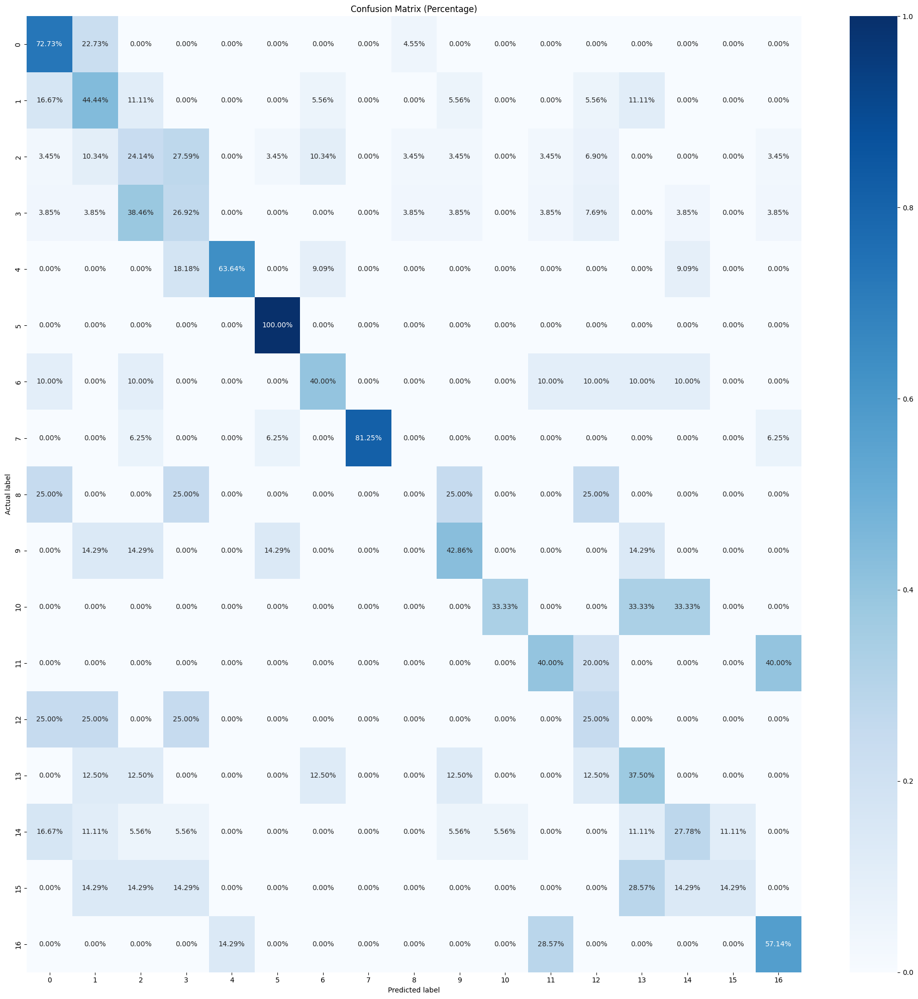

Loss: 5.2904 Acc: 0.4817
Accuracy: 48.17%
Test Loss: 5.2904 Test Acc: 0.4817


In [ ]:
num_classes = 17
model = Simple3DCNN(num_classes=num_classes)

#num_classes = 20  # Replace with your actual number of classes
#model = Simple2DCNN(num_classes=num_classes)


torch.cuda.empty_cache()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
torch.cuda.empty_cache()

# Train and evaluate
trained_model, val_acc_history, confusion_matrix_total = train_model(
    model,
    dataloaders,
    criterion,
    optimizer,
    num_epochs=20,
    device=device,
    num_classes=num_classes
)

test_loss, test_acc = evaluate_model(trained_model, test_loader, criterion, device)

print(f'Test Loss: {test_loss:.4f} Test Acc: {test_acc:.4f}')

In [ ]:
torch.cuda.empty_cache()

In [ ]:
import gc
#Clean the dataset 3D CNN if exists


#del test_loader
#del train_loader
#del dataloaders
#del trained_model

gc.collect()

12911

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import math
from functools import partial

__all__ = [
    'ResNet', 'resnet10', 'resnet18', 'resnet34', 'resnet50', 'resnet101',
    'resnet152', 'resnet200'
]


def conv3x3x3(in_planes, out_planes, stride=1):
    # 3x3x3 convolution with padding
    return nn.Conv3d(
        in_planes,
        out_planes,
        kernel_size=3,
        stride=stride,
        padding=1,
        bias=False)


def downsample_basic_block(x, planes, stride):
    out = F.avg_pool3d(x, kernel_size=1, stride=stride)
    zero_pads = torch.Tensor(
        out.size(0), planes - out.size(1), out.size(2), out.size(3),
        out.size(4)).zero_()
    if isinstance(out.data, torch.cuda.FloatTensor):
        zero_pads = zero_pads.cuda()

    out = Variable(torch.cat([out.data, zero_pads], dim=1))

    return out


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3x3(inplanes, planes, stride)
        self.bn1 = nn.BatchNorm3d(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3x3(planes, planes)
        self.bn2 = nn.BatchNorm3d(planes)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv3d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm3d(planes)
        self.conv2 = nn.Conv3d(
            planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm3d(planes)
        self.conv3 = nn.Conv3d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm3d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class ResNet(nn.Module):
    def __init__(self,
                 block,
                 layers,
                 sample_size,
                 sample_duration,
                 shortcut_type='B',
                 num_classes=400):
        self.inplanes = 64
        super(ResNet, self).__init__()
        self.conv1 = nn.Conv3d(
            1,  # Changed from 3 to 1 to accept grayscale input
            64,
            kernel_size=7,
            stride=(1, 2, 2),
            padding=(3, 3, 3),
            bias=False)
        self.bn1 = nn.BatchNorm3d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool3d(kernel_size=(3, 3, 3), stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0], shortcut_type)
        self.layer2 = self._make_layer(
            block, 128, layers[1], shortcut_type, stride=2)
        self.layer3 = self._make_layer(
            block, 256, layers[2], shortcut_type, stride=2)
        self.layer4 = self._make_layer(
            block, 512, layers[3], shortcut_type, stride=2)
        # Adjust the average pooling layer to have a kernel size of 1 in the temporal dimension
        last_duration = int(math.ceil(sample_duration / 16))
        last_size = int(math.ceil(sample_size / 32))
        self.avgpool = nn.AvgPool3d(
            (1, last_size, last_size), stride=1)
        self.fc = nn.Linear(1024 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv3d):
                m.weight = nn.init.kaiming_normal(m.weight, mode='fan_out')
            elif isinstance(m, nn.BatchNorm3d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, shortcut_type, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            if shortcut_type == 'A':
                downsample = partial(
                    downsample_basic_block,
                    planes=planes * block.expansion,
                    stride=stride)
            else:
                downsample = nn.Sequential(
                    nn.Conv3d(
                        self.inplanes,
                        planes * block.expansion,
                        kernel_size=1,
                        stride=stride,
                        bias=False), nn.BatchNorm3d(planes * block.expansion))

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)

        x = x.view(x.size(0), -1)
        x = self.fc(x)

        return x


def get_fine_tuning_parameters(model, ft_portion):
    if ft_portion == "complete":
        return model.parameters()

    elif ft_portion == "last_layer":
        ft_module_names = []
        ft_module_names.append('fc')

        parameters = []
        for k, v in model.named_parameters():
            for ft_module in ft_module_names:
                if ft_module in k:
                    parameters.append({'params': v})
                    break
            else:
                parameters.append({'params': v, 'lr': 0.0})
        return parameters

    else:
        raise ValueError("Unsupported ft_portion: 'complete' or 'last_layer' expected")


def resnet10(**kwargs):
    """Constructs a ResNet-18 model.
    """
    model = ResNet(BasicBlock, [1, 1, 1, 1], **kwargs)
    return model


def resnet18(sample_size, sample_duration, num_classes=400, **kwargs):
    """Constructs a ResNet-18 model for grayscale inputs."""
    model = ResNet(BasicBlock, [2, 2, 2, 2], sample_size, sample_duration, num_classes=num_classes, **kwargs)
    model.conv1 = nn.Conv3d(
        1,  # Changed from 3 to 1 to accept grayscale input
        64,
        kernel_size=7,
        stride=(1, 2, 2),
        padding=(3, 3, 3),
        bias=False)
    return model


def resnet34(**kwargs):
    """Constructs a ResNet-34 model.
    """
    model = ResNet(BasicBlock, [3, 4, 6, 3], **kwargs)
    return model


def resnet50(**kwargs):
    """Constructs a ResNet-50 model.
    """
    model = ResNet(Bottleneck, [3, 4, 6, 3], **kwargs)
    model.conv1 = nn.Conv3d(
        1,  # Changed from 3 to 1 to accept grayscale input
        64,
        kernel_size=7,
        stride=(1, 2, 2),
        padding=(3, 3, 3),
        bias=False)
    return model


def resnet101(**kwargs):
    """Constructs a ResNet-101 model.
    """
    model = ResNet(Bottleneck, [3, 4, 23, 3], **kwargs)
    model.conv1 = nn.Conv3d(
        1,  # Changed from 3 to 1 to accept grayscale input
        64,
        kernel_size=7,
        stride=(1, 2, 2),
        padding=(3, 3, 3),
        bias=False)
    return model


def resnet152(**kwargs):
    """Constructs a ResNet-101 model.
    """
    model = ResNet(Bottleneck, [3, 8, 36, 3], **kwargs)
    return model


def resnet200(**kwargs):
    """Constructs a ResNet-101 model.
    """
    model = ResNet(Bottleneck, [3, 24, 36, 3], **kwargs)
    return model

In [ ]:
# Create DataLoader instances (choose 2DCNN or 3DCNN as model_type)
train_dataset_3d = VideoDataset(directory='/content/train_data', transform=transform, model_type='3DCNN')
test_dataset_3d = VideoDataset(directory='/content/test_data', transform=transform, model_type='3DCNN')

train_loader = DataLoader(train_dataset_3d, batch_size=16, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset_3d, batch_size=16, shuffle=False, num_workers=2)

dataloaders = {
    'train': train_loader,
    'val': test_loader
}

<ipython-input-12-4b6137b07b7a>:145: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  m.weight = nn.init.kaiming_normal(m.weight, mode='fan_out')


Epoch 0/29


Epoch 1 train Progress: 100%|██████████| 59/59 [28:50<00:00, 29.33s/it]


train Loss: 3.5773 Acc: 9.9465%


Epoch 1 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.63s/it]


val Loss: 11.0706 Acc: 12.4464%
Epoch 1/29


Epoch 2 train Progress: 100%|██████████| 59/59 [27:56<00:00, 28.41s/it]


train Loss: 2.8064 Acc: 15.4011%


Epoch 2 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.65s/it]


val Loss: 2.8209 Acc: 14.1631%
Epoch 2/29


Epoch 3 train Progress: 100%|██████████| 59/59 [29:30<00:00, 30.01s/it]


train Loss: 2.7401 Acc: 17.1123%


Epoch 3 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.68s/it]


val Loss: 2.8063 Acc: 13.3047%
Epoch 3/29


Epoch 4 train Progress: 100%|██████████| 59/59 [29:03<00:00, 29.55s/it]


train Loss: 2.6093 Acc: 21.4973%


Epoch 4 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.66s/it]


val Loss: 2.9632 Acc: 23.6052%
Epoch 4/29


Epoch 5 train Progress: 100%|██████████| 59/59 [28:56<00:00, 29.43s/it]


train Loss: 2.4675 Acc: 26.5241%


Epoch 5 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.71s/it]


val Loss: 2.5303 Acc: 22.3176%
Epoch 5/29


Epoch 6 train Progress: 100%|██████████| 59/59 [29:03<00:00, 29.55s/it]


train Loss: 2.3979 Acc: 27.5936%


Epoch 6 val Progress: 100%|██████████| 15/15 [01:52<00:00,  7.50s/it]


val Loss: 2.4252 Acc: 27.4678%
Epoch 6/29


Epoch 7 train Progress: 100%|██████████| 59/59 [29:09<00:00, 29.66s/it]


train Loss: 2.2918 Acc: 29.4118%


Epoch 7 val Progress: 100%|██████████| 15/15 [01:57<00:00,  7.81s/it]


val Loss: 2.4980 Acc: 29.1845%
Epoch 7/29


Epoch 8 train Progress: 100%|██████████| 59/59 [29:08<00:00, 29.63s/it]


train Loss: 2.1881 Acc: 33.6898%


Epoch 8 val Progress: 100%|██████████| 15/15 [01:51<00:00,  7.45s/it]


val Loss: 2.3807 Acc: 30.0429%
Epoch 8/29


Epoch 9 train Progress: 100%|██████████| 59/59 [29:05<00:00, 29.59s/it]


train Loss: 2.1550 Acc: 33.5829%


Epoch 9 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.76s/it]


val Loss: 2.3721 Acc: 29.1845%
Epoch 9/29


Epoch 10 train Progress: 100%|██████████| 59/59 [29:12<00:00, 29.71s/it]


train Loss: 2.0537 Acc: 38.5027%


Epoch 10 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.68s/it]


val Loss: 2.4087 Acc: 27.4678%
Epoch 10/29


Epoch 11 train Progress: 100%|██████████| 59/59 [29:00<00:00, 29.50s/it]


train Loss: 2.0262 Acc: 35.9358%


Epoch 11 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.75s/it]


val Loss: 2.1338 Acc: 30.4721%
Epoch 11/29


Epoch 12 train Progress: 100%|██████████| 59/59 [28:59<00:00, 29.49s/it]


train Loss: 1.9952 Acc: 39.5722%


Epoch 12 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.66s/it]


val Loss: 2.6155 Acc: 36.0515%
Epoch 12/29


Epoch 13 train Progress: 100%|██████████| 59/59 [29:00<00:00, 29.50s/it]


train Loss: 2.0867 Acc: 35.2941%


Epoch 13 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.64s/it]


val Loss: 2.7829 Acc: 31.7597%
Epoch 13/29


Epoch 14 train Progress: 100%|██████████| 59/59 [28:57<00:00, 29.45s/it]


train Loss: 1.9622 Acc: 39.7861%


Epoch 14 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.64s/it]


val Loss: 2.3884 Acc: 36.4807%
Epoch 14/29


Epoch 15 train Progress: 100%|██████████| 59/59 [28:57<00:00, 29.44s/it]


train Loss: 1.8585 Acc: 41.8182%


Epoch 15 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.73s/it]


val Loss: 1.8615 Acc: 42.0601%
Epoch 15/29


Epoch 16 train Progress: 100%|██████████| 59/59 [29:02<00:00, 29.53s/it]


train Loss: 1.7505 Acc: 44.4920%


Epoch 16 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.67s/it]


val Loss: 1.8703 Acc: 43.7768%
Epoch 16/29


Epoch 17 train Progress: 100%|██████████| 59/59 [28:52<00:00, 29.37s/it]


train Loss: 1.6954 Acc: 46.3102%


Epoch 17 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.75s/it]


val Loss: 2.2584 Acc: 37.3391%
Epoch 17/29


Epoch 18 train Progress: 100%|██████████| 59/59 [28:59<00:00, 29.49s/it]


train Loss: 1.7352 Acc: 46.6310%


Epoch 18 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.70s/it]


val Loss: 1.7283 Acc: 45.9227%
Epoch 18/29


Epoch 19 train Progress: 100%|██████████| 59/59 [28:52<00:00, 29.36s/it]


train Loss: 1.6261 Acc: 47.3797%


Epoch 19 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.78s/it]


val Loss: 1.7526 Acc: 45.0644%
Epoch 19/29


Epoch 20 train Progress: 100%|██████████| 59/59 [29:02<00:00, 29.54s/it]


train Loss: 1.4749 Acc: 50.1604%


Epoch 20 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.63s/it]


val Loss: 2.0140 Acc: 42.0601%
Epoch 20/29


Epoch 21 train Progress: 100%|██████████| 59/59 [29:02<00:00, 29.54s/it]


train Loss: 1.5373 Acc: 50.9091%


Epoch 21 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.72s/it]


val Loss: 2.0150 Acc: 34.7639%
Epoch 21/29


Epoch 22 train Progress: 100%|██████████| 59/59 [29:08<00:00, 29.64s/it]


train Loss: 1.3799 Acc: 55.0802%


Epoch 22 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.71s/it]


val Loss: 1.8240 Acc: 46.7811%
Epoch 22/29


Epoch 23 train Progress: 100%|██████████| 59/59 [28:56<00:00, 29.44s/it]


train Loss: 1.3456 Acc: 56.2567%


Epoch 23 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.77s/it]


val Loss: 2.0405 Acc: 45.4936%
Epoch 23/29


Epoch 24 train Progress: 100%|██████████| 59/59 [29:03<00:00, 29.55s/it]


train Loss: 1.2606 Acc: 60.6417%


Epoch 24 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.78s/it]


val Loss: 2.1528 Acc: 43.3476%
Epoch 24/29


Epoch 25 train Progress: 100%|██████████| 59/59 [28:59<00:00, 29.48s/it]


train Loss: 1.1892 Acc: 62.7807%


Epoch 25 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.65s/it]


val Loss: 1.7787 Acc: 51.9313%
Epoch 25/29


Epoch 26 train Progress: 100%|██████████| 59/59 [29:07<00:00, 29.62s/it]


train Loss: 1.0675 Acc: 65.4545%


Epoch 26 val Progress: 100%|██████████| 15/15 [01:54<00:00,  7.64s/it]


val Loss: 3.5540 Acc: 36.9099%
Epoch 26/29


Epoch 27 train Progress: 100%|██████████| 59/59 [28:59<00:00, 29.47s/it]


train Loss: 1.1789 Acc: 61.7112%


Epoch 27 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.70s/it]


val Loss: 1.7694 Acc: 47.6395%
Epoch 27/29


Epoch 28 train Progress: 100%|██████████| 59/59 [29:01<00:00, 29.51s/it]


train Loss: 0.9510 Acc: 68.4492%


Epoch 28 val Progress: 100%|██████████| 15/15 [01:56<00:00,  7.74s/it]


val Loss: 2.1004 Acc: 44.2060%
Epoch 28/29


Epoch 29 train Progress: 100%|██████████| 59/59 [29:06<00:00, 29.61s/it]


train Loss: 0.8497 Acc: 70.6952%


Epoch 29 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.67s/it]


val Loss: 1.8640 Acc: 45.4936%
Epoch 29/29


Epoch 30 train Progress: 100%|██████████| 59/59 [29:04<00:00, 29.56s/it]


train Loss: 0.8405 Acc: 71.6578%


Epoch 30 val Progress: 100%|██████████| 15/15 [01:55<00:00,  7.72s/it]

val Loss: 1.7428 Acc: 56.6524%
Training complete in 927m 53s
Best val Acc: 56.6524


Loss: 1.7428 Acc: 0.5665


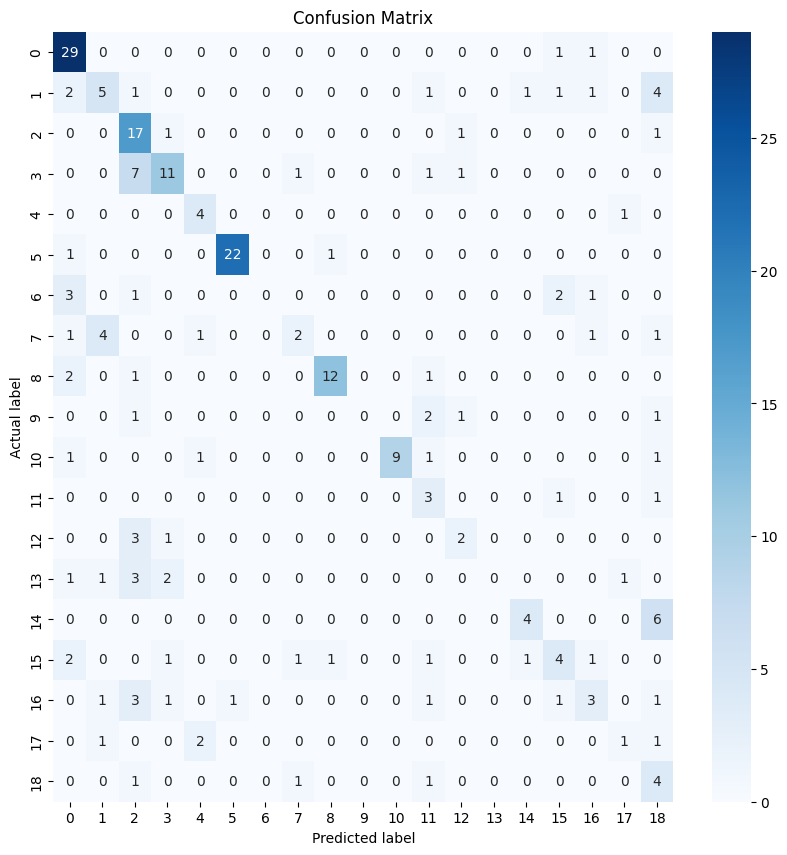

Accuracy: 56.65%
Test Loss: 1.7428 Test Acc: 0.5665


In [ ]:
# @title Default title text
num_classes = 19  # Adjust based on your dataset
sample_size = 224  # Adjust based on your video frame size
sample_duration = 30  # Adjust based on the number of frames in each video clip

model = resnet50(num_classes=num_classes, sample_size=sample_size, sample_duration=sample_duration)
#Change from RGB to GrayScale
#model.conv1 = nn.Conv3d(
 #   1,
 #   64,
 #   kernel_size=7,
 #   stride=(1, 2, 2),
 #   padding=(3, 3, 3),
 #   bias=False)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")

model = model.to(device)


# Rest of your setup remains the same
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate
trained_model, val_acc_history, confusion_matrix_total = train_model(
    model,
    dataloaders,
    criterion,
    optimizer,
    num_epochs=30,
    device=device,
    num_classes = num_classes
)

test_loss, test_acc = evaluate_model(trained_model, test_loader, criterion, device)
print(f'Test Loss: {test_loss:.4f} Test Acc: {test_acc:.4f}')


In [ ]:
import gc
import torch

torch.cuda.empty_cache()

del model
del test_loader
del train_loader
del dataloaders
#del trained_model

gc.collect()

In [ ]:
gc.collect()

9

### Siamese Network

In [ ]:
def clear_directory(directory):
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        if os.path.isfile(item_path) or os.path.islink(item_path):
            os.unlink(item_path)
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)

In [ ]:
import os
import shutil
import random

# Base directory paths
base_dir = '/content/drive/My Drive/inner_mirror'
clips_dir = os.path.join(base_dir, 'clips')

# New directory paths for training and testing
train_support_dir = '/content/train_support'
train_query_dir = '/content/train_query'
test_support_dir = '/content/test_support'
test_query_dir = '/content/test_query'

few_shot_activities = ['exiting_car', 'putting_on_sunglasses', 'taking_off_sunglasses', 'preparing_food',
                       'entering_car', 'closing_laptop', 'opening_door_inside',
                       'closing_door_inside', 'opening_backpack', 'putting_laptop_into_backpack', 'closing_door_outside',
                       'taking_laptop_from_backpack']
#clear_directory(train_support_dir)
#clear_directory(train_query_dir)
#clear_directory(test_support_dir)
#clear_directory(test_query_dir)
# Ensure the directories exist
os.makedirs(train_support_dir, exist_ok=True)
os.makedirs(train_query_dir, exist_ok=True)
os.makedirs(test_support_dir, exist_ok=True)
os.makedirs(test_query_dir, exist_ok=True)

def distribute_clips(few_shot_activities, clips_dir, train_support_dir, train_query_dir, test_support_dir, test_query_dir, test_split=0.2):
    for activity in few_shot_activities:
        activity_path = os.path.join(clips_dir, activity)
        activity_clips = [os.path.join(activity_path, clip) for clip in os.listdir(activity_path) if clip.endswith('.mp4')]
        random.shuffle(activity_clips)  # Randomize clips

        # Split clips for training and testing
        num_test = int(len(activity_clips) * test_split)
        test_clips = activity_clips[:num_test]
        train_clips = activity_clips[num_test:]

        # For training, select one clip for the support set, the rest go into the query set
        train_support_clips = train_clips[:1]
        train_query_clips = train_clips[1:]

        # For testing, select one clip for the support set, the rest go into the query set
        test_support_clips = test_clips[:1]
        test_query_clips = test_clips[1:]

        # Copy the selected clips to their respective directories
        for clip in train_support_clips:
            shutil.copy(clip, train_support_dir)
        for clip in train_query_clips:
            shutil.copy(clip, train_query_dir)
        for clip in test_support_clips:
            shutil.copy(clip, test_support_dir)
        for clip in test_query_clips:
            shutil.copy(clip, test_query_dir)

# Call the function to distribute clips
distribute_clips(few_shot_activities, clips_dir, train_support_dir, train_query_dir, test_support_dir, test_query_dir, test_split=0.2)


In [ ]:
import os
import torch
import cv2
from torch.utils.data import Dataset
import numpy as np
import random
import logging


class SiameseVideoDataset(Dataset):
    def __init__(self, support_dir, query_dir, transform=None, frames_per_video=20):
        self.frames_per_video = frames_per_video
        self.transform = transform
        self.support_videos, self.support_labels = self._load_video_paths(support_dir)
        self.query_videos, self.query_labels = self._load_video_paths(query_dir)

    def _load_video_paths(self, directory):
        video_paths = {}
        labels = set()
        for filename in os.listdir(directory):
            if not filename.endswith(".mp4"):
                continue
            label = filename.split('_')[0]
            labels.add(label)
            if label not in video_paths:
                video_paths[label] = []
            path = os.path.join(directory, filename)
            video_paths[label].append(path)
        return video_paths, labels

    def _sample_video_frames(self, video_path):
        cap = cv2.VideoCapture(video_path)
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        sample_every = max(1, frame_count // self.frames_per_video)

        frames = []
        for i in range(0, frame_count, sample_every):
            cap.set(cv2.CAP_PROP_POS_FRAMES, i)
            ret, frame = cap.read()
            if not ret:
                break
           # frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            if self.transform:
                frame = self.transform(frame)
            else:
                # If no transform specified, convert to tensor manually
                transform_to_tensor = transforms.Compose([
                    transforms.ToPILImage(),
                    transforms.ToTensor()
                ])
                frame = transform_to_tensor(frame)
            frames.append(frame)
            if len(frames) == self.frames_per_video:
                break
        cap.release()

        # Padding if frames are not enough
        while len(frames) < self.frames_per_video:
        # Create a zero tensor based on the first frame
            zero_frame = torch.zeros_like(frames[0]) if isinstance(frames[0], torch.Tensor) else torch.zeros(frames[0].shape)
            frames.append(zero_frame)

        return torch.stack(frames)

    def _create_label_index(self):
        label_to_index = {label: idx for idx, label in enumerate(self.support_labels.union(self.query_labels))}
        return label_to_index

    #Creating pairs in a Siamese network, especially for tasks like one-shot learning ,
    # serves a crucial purpose. A Siamese network learns to differentiate between inputs by comparing pairs of data points
    # and understanding the similarities or differences between them.
    def _create_pairs(self):
        pairs = []
        labels = []
        for label in self.support_labels:
            support_videos = self.support_videos.get(label, [])
            query_videos = self.query_videos.get(label, [])
            for support_video in support_videos:
                for query_video in query_videos:
                    pairs.append((support_video, query_video))
                    labels.append(1)  # Matching pair
            # Generating non-matching pairs
            for non_match_label in self.support_labels.difference([label]):
                non_match_videos = self.query_videos.get(non_match_label, [])
                for support_video in support_videos:
                    for non_match_video in non_match_videos:
                        pairs.append((support_video, non_match_video))
                        labels.append(0)  # Non-matching pair
        return pairs, labels

    def __len__(self):
        # Assuming each support video is paired with each query video once.
        total_pairs = 0
        for label in self.support_labels:
            total_support = len(self.support_videos[label])
            # For matching pairs
            total_pairs += total_support * len(self.query_videos[label])
            # For non-matching pairs
            for non_match_label in self.query_labels - {label}:
                total_pairs += total_support * len(self.query_videos[non_match_label])
        return total_pairs

    def __getitem__(self, idx):
        support_label = random.choice(list(self.support_labels))
        support_path = random.choice(self.support_videos[support_label])
        support_video = self._sample_video_frames(support_path)

        # Get a matching or non-matching query video
        match = random.choice([True, False])
        if match:
            query_path = random.choice(self.query_videos[support_label])
        else:
            non_matching_labels = list(self.query_labels - {support_label})
            non_match_label = random.choice(non_matching_labels)
            query_path = random.choice(self.query_videos[non_match_label])

        query_video = self._sample_video_frames(query_path)

        # Debug print statements to check the shape of the video tensors
        #print('Support video shape:', support_video.shape)  # Expected shape: (frames_per_video, height, width)
        #print('Query video shape:', query_video.shape)      # Expected shape: (frames_per_video, height, width)

        # Ensuring that the tensors have a channel dimension if not already present
        if len(support_video.shape) == 3:  # If shape is (frames, height, width)
            support_video = support_video.unsqueeze(1)  # Add channel dimension: (frames, 1, height, width)
        if len(query_video.shape) == 3:  # If shape is (frames, height, width)
            query_video = query_video.unsqueeze(1)  # Add channel dimension: (frames, 1, height, width)

        # Debug print statements to check the shape after unsqueeze operation
        support_video = support_video.unsqueeze(1)  # shape will be [20, 1, 224, 224]
        query_video = query_video.unsqueeze(1)  # shape will be [20, 1, 224, 224]

        # Ensuring correct tensor shape [batch_size, channels, depth, height, width]
        #print('Support video shape before batch:', support_video.shape)
        #print('Query video shape before batch:', query_video.shape)

        match_label = torch.tensor(int(match), dtype=torch.float32)


        return support_video, query_video, match_label






In [ ]:
from torch.utils.data import DataLoader
import torchvision.transforms as transforms

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


train_dataset = SiameseVideoDataset(support_dir=train_support_dir, query_dir=train_query_dir, transform=transform)
test_dataset = SiameseVideoDataset(support_dir=test_support_dir, query_dir=test_query_dir, transform=transform)

# DataLoader
#train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True)
#test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False)


In [ ]:
from torch.utils.data.dataloader import default_collate

def custom_collate(batch):
    support_videos = torch.stack([item[0].squeeze(1) for item in batch], dim=0)
    query_videos = torch.stack([item[1].squeeze(1) for item in batch], dim=0)
    labels = torch.stack([item[2] for item in batch], dim=0)

    return support_videos, query_videos, labels

train_dataloader = DataLoader(train_dataset, batch_size=14, shuffle=True, collate_fn=custom_collate)
test_dataloader = DataLoader(test_dataset, batch_size=14, shuffle=False, collate_fn=custom_collate)

# Check the shape of a batch
#for batch in train_dataloader:
#    support_videos, query_videos, labels = batch
#    print('Batched support videos shape:', support_videos.shape)  # Expected shape: [4, 1, 20, 224, 224]
#    print('Batched query videos shape:', query_videos.shape)      # Expected shape: [4, 1, 20, 224, 224]
#    break  # Just for checking the first batch


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SiameseNetwork3DCNN(nn.Module):
    def __init__(self, input_channels=1):
        super(SiameseNetwork3DCNN, self).__init__()

        # Define the convolutional layers
        self.conv_layers = nn.Sequential(
            nn.Conv3d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),

            nn.Conv3d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),

            nn.Conv3d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),
            # Add additional layers as necessary
        )

        # Dynamically calculate the flattened feature size
        self.flat_features = self._get_flat_features(input_channels)

        # Define the fully connected layers
        self.fc_layers = nn.Sequential(
            nn.Linear(self.flat_features, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(512, 128),
        )

    def _get_flat_features(self, input_channels):
        # Initialize a dummy input to pass through the conv layers to determine output size
        dummy_input = torch.zeros(1, input_channels, 20, 224, 224)  # Adjust size based on your actual data
        dummy_output = self.conv_layers(dummy_input)
        return int(np.prod(dummy_output.size()[1:]))

    def forward_one(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.fc_layers(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2


In [ ]:
class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """
    def __init__(self, margin=1.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2)
        loss_contrastive = torch.mean((1 - label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))
        return loss_contrastive


In [ ]:
from tqdm import tqdm

def train_model12(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=None):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = ContrastiveLoss()

    for epoch in tqdm(range(epochs), desc='Epochs Progress'):
        running_loss = 0.0

        for batch in tqdm(train_dataloader, desc=f'Epoch {epoch+1}/{epochs} Progress'):
            # Extract inputs and labels from the batch
            inputs1, inputs2, labels = batch

            # Check for extra dimension and adjust if necessary
            if inputs1.dim() == 6:
                inputs1 = inputs1.squeeze(2)
                inputs2 = inputs2.squeeze(2)

            # Move tensors to the configured device
            inputs1, inputs2, labels = inputs1.to(device), inputs2.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs1, outputs2 = model(inputs1, inputs2)
            loss = criterion(outputs1, outputs2, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_loss = running_loss / len(train_dataloader.dataset)
        print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

    print('Training complete')


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SiameseNetwork3DCNN(nn.Module):
    def __init__(self):
        super(SiameseNetwork3DCNN, self).__init__()
        # Convolutional layers
        self.conv_layers = nn.Sequential(
            nn.Conv3d(1, 64, kernel_size=3, stride=1, padding=1),  # Assuming grayscale input, so 1 input channel
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),

            nn.Conv3d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),

            nn.Conv3d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),
        )

        # Automatically calculate the size of the flattened features after the conv layers
        with torch.no_grad():
            # Create a dummy tensor to pass through the conv layers to calculate the output size
            dummy_input = torch.zeros(1, 1, 20, 224, 224)  # Adjust size if your actual input differs
            dummy_output = self.conv_layers(dummy_input)
            flat_features = dummy_output.numel()

        # Fully connected layers
        self.fc_layers = nn.Sequential(
            nn.Linear(flat_features, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(512, 128),
        )

    def forward_one(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.fc_layers(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2


In [ ]:
import torch.optim as optim
import torch.nn.functional as F
from tqdm.notebook import tqdm

def train_model14(model, train_dataloader, epochs=10, learning_rate=0.001, device=None):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = ContrastiveLoss()

    for epoch in tqdm(range(epochs), desc='Epochs Progress', unit='epoch'):
        running_loss = 0.0

        # Wrap the dataloader with tqdm for an inline updating progress bar
        for data in tqdm(train_dataloader, desc=f'Training Progress (Epoch {epoch+1}/{epochs})', unit='batch', leave=False):
            inputs1, inputs2, labels = data

            # Correct input dimensions if needed
            if inputs1.dim() == 6 and inputs1.size(2) == 1:
                inputs1 = inputs1.squeeze(2)
                inputs2 = inputs2.squeeze(2)

            # Adjust dimensions if necessary
            if inputs1.dim() == 5:
                inputs1 = inputs1.permute(0, 2, 1, 3, 4)
                inputs2 = inputs2.permute(0, 2, 1, 3, 4)

            inputs1, inputs2, labels = inputs1.to(device), inputs2.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs1, outputs2 = model(inputs1, inputs2)
            loss = criterion(outputs1, outputs2, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_loss = running_loss / len(train_dataloader.dataset)
        print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

    print('Training complete')


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = SiameseNetwork3DResNet().to(device)
model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=10, learning_rate=0.001, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)


In [ ]:
import torch
import torch.nn as nn
import torchvision.models.video as video_models

class SiameseNetwork3DResNet(nn.Module):
    def __init__(self):
        super(SiameseNetwork3DResNet, self).__init__()
        # Load a pretrained 3D ResNet model
        self.base_model = video_models.r3d_18(pretrained=True)
        #For GrayScale we have to set first input (number of channels) to one
        self.base_model.stem[0] = nn.Conv3d(1, 64, kernel_size=(3, 7, 7), stride=(1, 2, 2), padding=(1, 3, 3), bias=False)
        num_features = self.base_model.fc.in_features
        self.base_model.fc = nn.Linear(num_features, 128)

    def forward_one(self, x):
        return self.base_model(x)

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2


In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=14, shuffle=True, collate_fn=custom_collate)
test_dataloader = DataLoader(test_dataset, batch_size=14, shuffle=False, collate_fn=custom_collate)

Epochs Progress:   0%|          | 0/10 [00:00<?, ?epoch/s]

Training Progress (Epoch 1/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 1/10, Loss: 33.3923


Training Progress (Epoch 2/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 2/10, Loss: 0.0195


Training Progress (Epoch 3/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 3/10, Loss: 0.0191


Training Progress (Epoch 4/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 4/10, Loss: 0.0196


Training Progress (Epoch 5/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 5/10, Loss: 0.0193


Training Progress (Epoch 6/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 6/10, Loss: 0.0193


Training Progress (Epoch 7/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 7/10, Loss: 0.0196


Training Progress (Epoch 8/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 8/10, Loss: 0.0197


Training Progress (Epoch 9/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 9/10, Loss: 0.0197


Training Progress (Epoch 10/10):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 10/10, Loss: 0.0196
Training complete


Evaluation Progress:   0%|          | 0/23 [00:00<?, ?batch/s]

Eval Loss: 0.0348
Accuracy: 49.38%


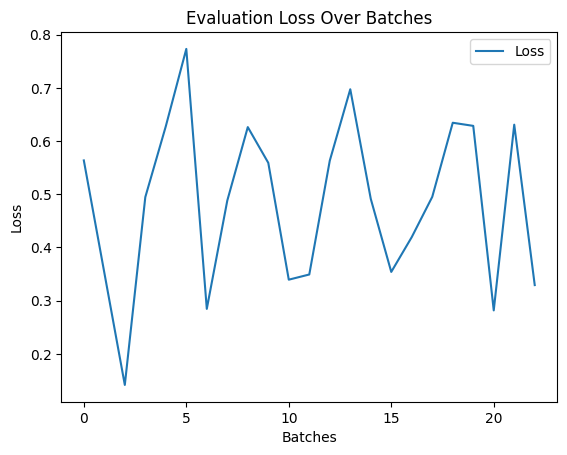

(0.034762239130213854, 49.375)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = SiameseNetwork3DResNet().to(device)
model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=10, learning_rate=0.001, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = SiameseNetwork3DResNet().to(device)
model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=7, learning_rate=0.001, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)

In [ ]:
import torch

def evaluate_model(model, dataloader, device=None):
    model.eval()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0
    criterion = ContrastiveLoss()

    losses = []  # Store losses for visualization

    with torch.no_grad():
        for data in tqdm(dataloader, desc='Evaluation Progress', unit='batch', leave=False):
            inputs1, inputs2, labels = data

            # Adjust input dimensions if necessary
            if inputs1.dim() == 6 and inputs1.size(2) == 1:
                inputs1 = inputs1.squeeze(2)
                inputs2 = inputs2.squeeze(2)

            if inputs1.dim() == 5:
                inputs1 = inputs1.permute(0, 2, 1, 3, 4)
                inputs2 = inputs2.permute(0, 2, 1, 3, 4)

            inputs1, inputs2, labels = inputs1.to(device), inputs2.to(device), labels.to(device)

            outputs1, outputs2 = model(inputs1, inputs2)
            loss = criterion(outputs1, outputs2, labels)

            # Calculate loss
            running_loss += loss.item()
            losses.append(loss.item())

            # Compute accuracy
            # You may need to modify this logic depending on how your model's output is structured
            predicted_similarity = (outputs1 - outputs2).norm(dim=1) < 0.5  # Example threshold
            correct_predictions += (predicted_similarity == labels).sum().item()
            total_predictions += labels.size(0)

    total_loss = running_loss / len(dataloader.dataset)
    accuracy = 100.0 * correct_predictions / total_predictions

    print(f'Eval Loss: {total_loss:.4f}')
    print(f'Accuracy: {accuracy:.2f}%')

    # Plotting the loss over batches
    plt.figure()
    plt.plot(losses, label='Loss')
    plt.xlabel('Batches')
    plt.ylabel('Loss')
    plt.title('Evaluation Loss Over Batches')
    plt.legend()
    plt.show()

    return total_loss, accuracy


Epochs Progress:   0%|          | 0/3 [00:00<?, ?epoch/s]

Training Progress (Epoch 1/3):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 1/3, Loss: 0.0202


Training Progress (Epoch 2/3):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 2/3, Loss: 0.0148


Training Progress (Epoch 3/3):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 3/3, Loss: 0.0139
Training complete


Evaluation Progress:   0%|          | 0/23 [00:00<?, ?batch/s]

Eval Loss: 0.0219
Accuracy: 50.94%


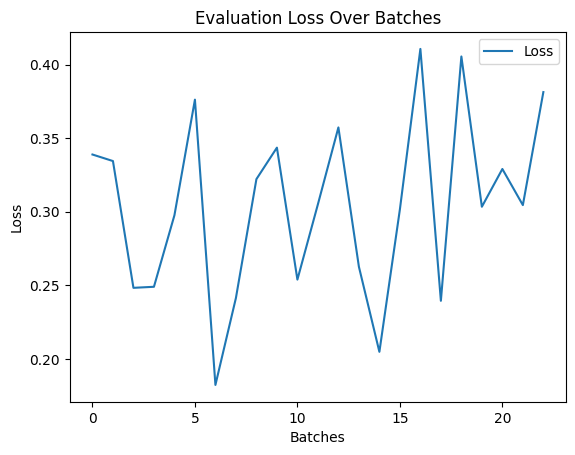

(0.02185513568110764, 50.9375)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SiameseNetwork3DResNet().to(device)
#model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=3, learning_rate=0.0001, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=R3D_18_Weights.KINETICS400_V1`. You can also use `weights=R3D_18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/r3d_18-b3b3357e.pth" to /root/.cache/torch/hub/checkpoints/r3d_18-b3b3357e.pth
100%|██████████| 127M/127M [00:00<00:00, 170MB/s]


Epochs Progress:   0%|          | 0/7 [00:00<?, ?epoch/s]

Training Progress (Epoch 1/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 1/7, Loss: 0.0254


Training Progress (Epoch 2/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 2/7, Loss: 0.0227


Training Progress (Epoch 3/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 3/7, Loss: 0.0226


Training Progress (Epoch 4/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 4/7, Loss: 0.0216


Training Progress (Epoch 5/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 5/7, Loss: 0.0203


Training Progress (Epoch 6/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 6/7, Loss: 0.0195


Training Progress (Epoch 7/7):   0%|          | 0/147 [00:00<?, ?batch/s]

Epoch 7/7, Loss: 0.0189
Training complete


Evaluation Progress:   0%|          | 0/23 [00:00<?, ?batch/s]

Eval Loss: 0.0233
Accuracy: 53.12%


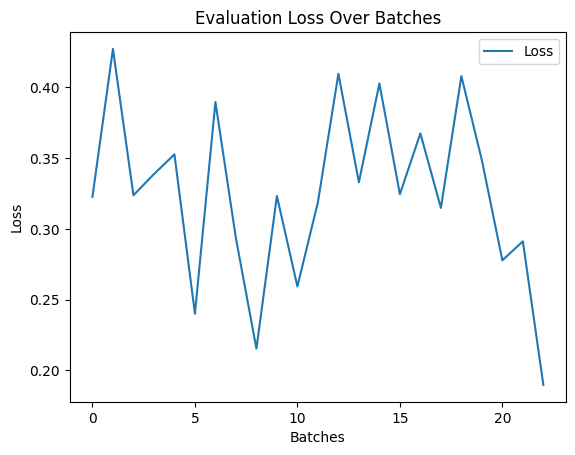

(0.023346333159133793, 53.125)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SiameseNetwork3DResNet().to(device)
#model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=7, learning_rate=0.001, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SiameseNetwork3DResNet().to(device)
#model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=12, learning_rate=0.005, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SiameseNetwork3DResNet().to(device)
#model = SiameseNetwork3DCNN().to(device)

# Train
#train_model13(model, train_dataloader, test_dataloader, epochs=10, learning_rate=0.001, device=device)
train_model14(model, train_dataloader,  epochs=12, learning_rate=0.005, device=device)

# Evaluate
evaluate_model(model, test_dataloader, device=device)



### **Few-Shot Learning Techniques**




In [ ]:
def clear_directory(directory):
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        if os.path.isfile(item_path) or os.path.islink(item_path):
            os.unlink(item_path)
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)

Classes and their counts:
closing_door_outside: 20
opening_laptop: 23
closing_laptop: 25
putting_on_jacket: 23
preparing_food: 21
talking_on_phone: 29
taking_off_jacket: 24
opening_door_inside: 25
exiting_car: 20
opening_backpack: 12
putting_laptop_into_backpack: 9
taking_laptop_from_backpack: 10
Total classes retained: 12


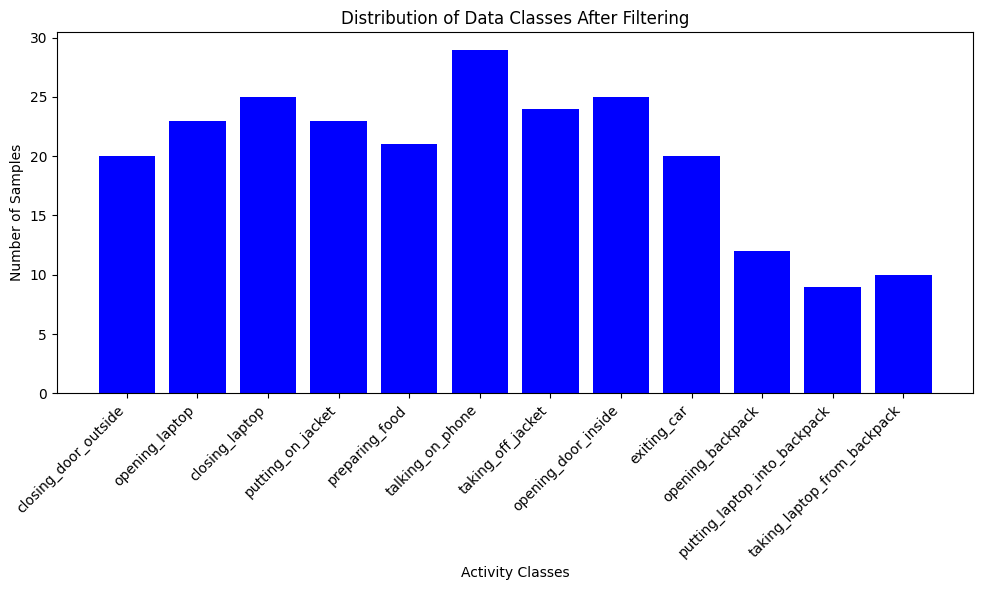

In [ ]:
import os
import shutil
import random
import matplotlib.pyplot as plt

# Base directory paths
base_dir = '/content/drive/My Drive/inner_mirror'
clips_dir = os.path.join(base_dir, 'clips')

# New directory paths for training and testing
train_support_dir = '/content/train_support'
train_query_dir = '/content/train_query'
test_support_dir = '/content/test_support'
test_query_dir = '/content/test_query'

# Ensure the directories exist
os.makedirs(train_support_dir, exist_ok=True)
os.makedirs(train_query_dir, exist_ok=True)
os.makedirs(test_support_dir, exist_ok=True)
os.makedirs(test_query_dir, exist_ok=True)

clear_directory(train_support_dir)
clear_directory(train_query_dir)
clear_directory(test_support_dir)
clear_directory(test_query_dir)

def distribute_clips(clips_dir, min_samples=5, max_samples=30):
    few_shot_activities = [activity for activity in os.listdir(clips_dir) if os.path.isdir(os.path.join(clips_dir, activity))]
    class_counts = {}

    for activity in few_shot_activities:
        activity_path = os.path.join(clips_dir, activity)
        activity_clips = [os.path.join(activity_path, clip) for clip in os.listdir(activity_path) if clip.endswith('.mp4')]
        random.shuffle(activity_clips)  # Randomize clips

        if min_samples <= len(activity_clips) < max_samples:
            # Allocate clips to different directories
            train_support_clips = activity_clips[:3]  # 3 samples for train support
            remaining_clips = activity_clips[3:]
            if len(remaining_clips) >= 5:
                test_support_clips = remaining_clips[:3]  # 3 sample for test support
                train_query_clips = remaining_clips[3:4]  # 1 sample for train query
                test_query_clips = remaining_clips[4:5]  # 1 sample for test query

                # Copy the selected clips to their respective directories
                for clip in train_support_clips:
                    shutil.copy(clip, train_support_dir)
                for clip in train_query_clips:
                    shutil.copy(clip, train_query_dir)
                for clip in test_support_clips:
                    shutil.copy(clip, test_support_dir)
                for clip in test_query_clips:
                    shutil.copy(clip, test_query_dir)

                class_counts[activity] = len(activity_clips)

    # Print class counts and labels
    print("Classes and their counts:")
    for activity, count in class_counts.items():
        print(f"{activity}: {count}")

    print(f"Total classes retained: {len(class_counts)}")

    # Plotting the distribution
    plt.figure(figsize=(10, 6))
    plt.bar(class_counts.keys(), class_counts.values(), color='blue')
    plt.xlabel('Activity Classes')
    plt.ylabel('Number of Samples')
    plt.title('Distribution of Data Classes After Filtering')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Call the function to distribute clips and plot the distribution
distribute_clips(clips_dir)



In [ ]:
import os
import torch
from torch.utils.data import Dataset
import cv2
from torchvision import transforms

class FewShotVideoDataset(Dataset):
    def __init__(self, support_dir, query_dir, transform=None, frames_per_video=15):
        self.frames_per_video = frames_per_video
        self.transform = transform
        self.support_videos = self._load_video_paths(support_dir)
        self.query_videos = self._load_video_paths(query_dir)
        self.labels = sorted(list(set(self.support_videos.keys()).intersection(self.query_videos.keys())))
        # Now print statements for debugging
        print(f"Labels: {self.labels}")
        print(f"Number of support samples: {sum(len(v) for v in self.support_videos.values())}")
        print(f"Number of query samples: {sum(len(v) for v in self.query_videos.values())}")

    def _load_video_paths(self, directory):
        video_paths = {}
        for filename in sorted(os.listdir(directory)):
            if filename.endswith('.mp4'):
                # Use rsplit to handle multiple underscores, assuming last part is always the video number
                label = '_'.join(filename.rsplit('_', 2)[:-1])
                video_paths.setdefault(label, []).append(os.path.join(directory, filename))
        return video_paths


    def _sample_video_frames(self, video_path):
        cap = cv2.VideoCapture(video_path)
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        sample_every = max(1, frame_count // self.frames_per_video)
        frames = []
        for i in range(self.frames_per_video):
            cap.set(cv2.CAP_PROP_POS_FRAMES, i * sample_every)
            ret, frame = cap.read()
            if ret:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) if frame.ndim == 3 else frame
                if self.transform:
                    frame = self.transform(frame)
                frames.append(frame)
            else:
                frames.append(torch.zeros(frames[0].shape))  # If the frame can't be read, use a zero tensor
        cap.release()
        return torch.stack(frames)

    def __len__(self):
        # Assuming equal number of support and query videos for each label
        return len(self.labels) * min(len(self.support_videos[self.labels[0]]), len(self.query_videos[self.labels[0]]))

    def _load_video_paths(self, directory):
        video_paths = {}
        for filename in sorted(os.listdir(directory)):
            if filename.endswith('.mp4'):
                # Extracting the full label before the first underscore assuming the format is "action_number.mp4"
                label = '_'.join(filename.split('_')[:-1])
                video_paths.setdefault(label, []).append(os.path.join(directory, filename))
        return video_paths

    def __getitem__(self, idx):
        # Get the label corresponding to the index
        label = self.labels[idx % len(self.labels)]

        # Get the support and query indices
        support_idx = idx // len(self.labels) % len(self.support_videos[label])
        query_idx = idx // (len(self.labels) * len(self.support_videos[label])) % len(self.query_videos[label])

        # Fetch the video paths
        support_video_path = self.support_videos[label][support_idx]
        query_video_path = self.query_videos[label][query_idx]

        # Sample the video frames
        support_video = self._sample_video_frames(support_video_path)
        query_video = self._sample_video_frames(query_video_path)

        # Get the label index (tensor)
        label_id = torch.tensor(self.labels.index(label), dtype=torch.long)

        # Return the support video, query video, and the label index
        return support_video, query_video, label_id



transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

train_support_dir = '/content/train_support'
train_query_dir = '/content/train_query'
test_support_dir = '/content/test_support'
test_query_dir = '/content/test_query'

train_dataset = FewShotVideoDataset(support_dir=train_support_dir, query_dir=train_query_dir, transform=transform)
test_dataset = FewShotVideoDataset(support_dir=test_support_dir, query_dir=test_query_dir, transform=transform)


Labels: ['closing_door_outside', 'closing_laptop', 'exiting_car', 'opening_backpack', 'opening_door_inside', 'opening_laptop', 'preparing_food', 'putting_laptop_into_backpack', 'putting_on_jacket', 'taking_laptop_from_backpack', 'taking_off_jacket', 'talking_on_phone']
Number of support samples: 36
Number of query samples: 12
Labels: ['closing_door_outside', 'closing_laptop', 'exiting_car', 'opening_backpack', 'opening_door_inside', 'opening_laptop', 'preparing_food', 'putting_laptop_into_backpack', 'putting_on_jacket', 'taking_laptop_from_backpack', 'taking_off_jacket', 'talking_on_phone']
Number of support samples: 36
Number of query samples: 12


Epochs Progress:   2%|▏         | 1/50 [01:05<53:31, 65.53s/epoch]

Epoch 1/50, Loss: 2.6395



Epochs Progress:   4%|▍         | 2/50 [02:15<54:44, 68.43s/epoch]

Epoch 2/50, Loss: 1.6811



Epochs Progress:   6%|▌         | 3/50 [03:35<57:34, 73.50s/epoch]

Epoch 3/50, Loss: 1.2491



Epochs Progress:   8%|▊         | 4/50 [04:53<57:47, 75.37s/epoch]

Epoch 4/50, Loss: 1.0390



Epochs Progress:  10%|█         | 5/50 [06:13<57:40, 76.89s/epoch]

Epoch 5/50, Loss: 1.0523



Epochs Progress:  12%|█▏        | 6/50 [07:21<54:12, 73.92s/epoch]

Epoch 6/50, Loss: 0.8928



Epochs Progress:  14%|█▍        | 7/50 [08:25<50:32, 70.52s/epoch]

Epoch 7/50, Loss: 0.9881



Epochs Progress:  16%|█▌        | 8/50 [09:27<47:34, 67.97s/epoch]

Epoch 8/50, Loss: 0.6980



Epochs Progress:  18%|█▊        | 9/50 [10:30<45:24, 66.46s/epoch]

Epoch 9/50, Loss: 0.6001



Epochs Progress:  20%|██        | 10/50 [11:33<43:34, 65.37s/epoch]

Epoch 10/50, Loss: 0.8149



Epochs Progress:  22%|██▏       | 11/50 [12:36<42:04, 64.74s/epoch]

Epoch 11/50, Loss: 0.8532



Epochs Progress:  24%|██▍       | 12/50 [13:40<40:48, 64.43s/epoch]

Epoch 12/50, Loss: 0.6522



Epochs Progress:  26%|██▌       | 13/50 [14:43<39:27, 63.98s/epoch]

Epoch 13/50, Loss: 0.7515



Epochs Progress:  28%|██▊       | 14/50 [15:47<38:19, 63.86s/epoch]

Epoch 14/50, Loss: 0.6519



Epochs Progress:  30%|███       | 15/50 [16:51<37:24, 64.12s/epoch]

Epoch 15/50, Loss: 0.5398



Epochs Progress:  32%|███▏      | 16/50 [17:55<36:11, 63.86s/epoch]

Epoch 16/50, Loss: 0.5435



Epochs Progress:  34%|███▍      | 17/50 [18:58<35:02, 63.72s/epoch]

Epoch 17/50, Loss: 0.5444



Epochs Progress:  36%|███▌      | 18/50 [20:01<33:55, 63.62s/epoch]

Epoch 18/50, Loss: 0.5884



Epochs Progress:  38%|███▊      | 19/50 [21:05<32:52, 63.63s/epoch]

Epoch 19/50, Loss: 0.6918



Epochs Progress:  40%|████      | 20/50 [22:08<31:41, 63.40s/epoch]

Epoch 20/50, Loss: 0.5933



Epochs Progress:  42%|████▏     | 21/50 [23:12<30:40, 63.47s/epoch]

Epoch 21/50, Loss: 0.7033



Epochs Progress:  44%|████▍     | 22/50 [24:15<29:34, 63.38s/epoch]

Epoch 22/50, Loss: 0.5131



Epochs Progress:  46%|████▌     | 23/50 [25:18<28:32, 63.44s/epoch]

Epoch 23/50, Loss: 0.5720



Epochs Progress:  48%|████▊     | 24/50 [26:22<27:27, 63.37s/epoch]

Epoch 24/50, Loss: 0.5344



Epochs Progress:  50%|█████     | 25/50 [27:25<26:22, 63.30s/epoch]

Epoch 25/50, Loss: 0.5024



Epochs Progress:  52%|█████▏    | 26/50 [28:28<25:21, 63.38s/epoch]

Epoch 26/50, Loss: 0.5595



Epochs Progress:  54%|█████▍    | 27/50 [29:32<24:18, 63.43s/epoch]

Epoch 27/50, Loss: 0.3936



Epochs Progress:  56%|█████▌    | 28/50 [30:35<23:16, 63.47s/epoch]

Epoch 28/50, Loss: 0.4690



Epochs Progress:  58%|█████▊    | 29/50 [31:38<22:10, 63.34s/epoch]

Epoch 29/50, Loss: 0.4594



Epochs Progress:  60%|██████    | 30/50 [32:42<21:09, 63.45s/epoch]

Epoch 30/50, Loss: 0.2868



Epochs Progress:  62%|██████▏   | 31/50 [33:45<20:04, 63.37s/epoch]

Epoch 31/50, Loss: 0.3583



Epochs Progress:  64%|██████▍   | 32/50 [34:48<18:59, 63.28s/epoch]

Epoch 32/50, Loss: 0.4198



Epochs Progress:  66%|██████▌   | 33/50 [35:51<17:55, 63.24s/epoch]

Epoch 33/50, Loss: 0.4385



Epochs Progress:  68%|██████▊   | 34/50 [36:55<16:52, 63.26s/epoch]

Epoch 34/50, Loss: 0.3491



Epochs Progress:  70%|███████   | 35/50 [37:58<15:48, 63.26s/epoch]

Epoch 35/50, Loss: 0.3334



Epochs Progress:  72%|███████▏  | 36/50 [39:01<14:45, 63.24s/epoch]

Epoch 36/50, Loss: 0.3397



Epochs Progress:  74%|███████▍  | 37/50 [40:04<13:40, 63.12s/epoch]

Epoch 37/50, Loss: 0.3754



Epochs Progress:  76%|███████▌  | 38/50 [41:09<12:45, 63.79s/epoch]

Epoch 38/50, Loss: 0.3745



Epochs Progress:  78%|███████▊  | 39/50 [42:13<11:39, 63.64s/epoch]

Epoch 39/50, Loss: 0.3735



Epochs Progress:  80%|████████  | 40/50 [43:16<10:35, 63.56s/epoch]

Epoch 40/50, Loss: 0.2327



Epochs Progress:  82%|████████▏ | 41/50 [44:19<09:30, 63.42s/epoch]

Epoch 41/50, Loss: 0.1978



Epochs Progress:  84%|████████▍ | 42/50 [45:23<08:28, 63.55s/epoch]

Epoch 42/50, Loss: 0.2103



Epochs Progress:  86%|████████▌ | 43/50 [46:26<07:24, 63.49s/epoch]

Epoch 43/50, Loss: 0.2702



Epochs Progress:  88%|████████▊ | 44/50 [47:30<06:20, 63.49s/epoch]

Epoch 44/50, Loss: 0.2401



Epochs Progress:  90%|█████████ | 45/50 [48:33<05:16, 63.35s/epoch]

Epoch 45/50, Loss: 0.2449



Epochs Progress:  92%|█████████▏| 46/50 [49:36<04:13, 63.30s/epoch]

Epoch 46/50, Loss: 0.1520



Epochs Progress:  94%|█████████▍| 47/50 [50:39<03:09, 63.10s/epoch]

Epoch 47/50, Loss: 0.1499



Epochs Progress:  96%|█████████▌| 48/50 [51:42<02:06, 63.21s/epoch]

Epoch 48/50, Loss: 0.3938



Epochs Progress:  98%|█████████▊| 49/50 [52:44<01:02, 62.85s/epoch]

Epoch 49/50, Loss: 0.1275



Epochs Progress: 100%|██████████| 50/50 [53:46<00:00, 64.54s/epoch]


Epoch 50/50, Loss: 0.1413
Training complete


Evaluation Progress: 100%|██████████| 6/6 [00:19<00:00,  3.31s/batch]


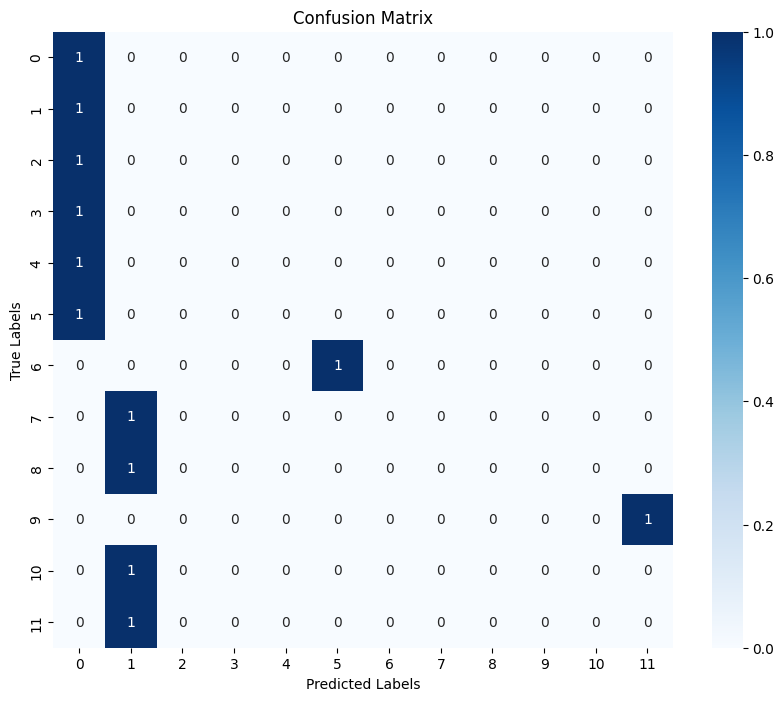

Test Accuracy: 8.33%
Test Accuracy: 8.33%


In [ ]:
import torch
import torch.nn as nn
import torchvision.models.video as video_models
from torch.optim import Adam
import torch.optim as optim
from torch.nn import functional as F
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


class MetaTransferLearning(nn.Module):
    def __init__(self, num_classes, num_channels=1, num_stacked_frames=22):  # Default to 1 for grayscale
        super(MetaTransferLearning, self).__init__()
        # Load the pre-trained model
        #self.base_model = video_models.r3d_18(pretrained=True)
        # Replace the first conv layer to accept 1-channel input if videos are grayscale
        #self.base_model.stem[0] = nn.Conv3d(num_channels, 64, kernel_size=(3, 7, 7), stride=(1, 2, 2), padding=(1, 3, 3), bias=False)
        # Adjust the final layer to the number of classes
        #num_features = self.base_model.fc.in_features
        #self.base_model.fc = nn.Linear(num_features, num_classes)

    #def forward(self, x):
        #return self.base_model(x)
        self.base_model = video_models.r3d_18(pretrained=True)
        # Modify the first conv layer to accept grayscale input (1 channel)
        self.base_model.stem[0] = nn.Conv3d(
            1,  # Number of input channels set to 1 for grayscale
            self.base_model.stem[0].out_channels,
            kernel_size=(3, 7, 7),
            stride=(1, 2, 2),
            padding=(1, 3, 3),
            bias=False
        )
        # Modify the final fully connected layer to have 128 output features
        num_features = self.base_model.fc.in_features
        self.base_model.fc = nn.Linear(num_features, 128)

    def forward(self, x):
        return self.base_model(x)

def train_model(model, train_dataloader, epochs, learning_rate, device):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in tqdm(range(epochs), desc='Epochs Progress', unit='epoch'):
        running_loss = 0.0
        # Instead of using 'leave=False' here, it is removed to have a single progress bar
        for batch in tqdm(train_dataloader,desc=f'Training Progress (Epoch {epoch+1}/{epochs})', unit='batch', leave=False):
            # Unpack all three items if your dataset's __getitem__ returns three items.
            # Assuming the first element is the videos you need and the third is the labels.
            videos, _, labels = batch

            if videos.ndim == 4:
                videos = videos.unsqueeze(1)  # Add the channel dimension

            videos = videos.permute(0, 2, 1, 3, 4)
            videos, labels = videos.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(videos)
            loss = F.cross_entropy(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()



        # Update the epoch's progress bar description with the average loss
        epoch_loss = running_loss / len(train_dataloader.dataset)
        print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

    print('Training complete')


def evaluate_model(model, dataloader, device=None):
   model.eval()
   all_labels = []
   all_preds = []
   all_probs = []

  # Create a single progress bar for all batches
   batch_iterator = tqdm(dataloader, desc='Evaluation Progress', unit='batch', leave=True)

   with torch.no_grad():
        for data in batch_iterator:
            # Assuming data loader returns support_video, query_video, and labels
            support_videos, query_videos, labels = data

            # If your support_videos tensor shape is [batch, 1, frames, H, W], permute to [batch, frames, 1, H, W]
            support_videos = support_videos.permute(0, 2, 1, 3, 4)

            support_videos = support_videos.to(device)
            labels = labels.to(device)

            outputs = model(support_videos)
            _, preds = torch.max(outputs, 1)
            probs = F.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

  # Calculate the confusion matrix and accuracy
   cm = confusion_matrix(all_labels, all_preds)
   accuracy = np.trace(cm) / np.sum(cm) * 100

  # Display the confusion matrix
   plt.figure(figsize=(10, 8))
   sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
   plt.xlabel('Predicted Labels')
   plt.ylabel('True Labels')
   plt.title('Confusion Matrix')
   plt.show()

   print(f'Test Accuracy: {accuracy:.2f}%')
   return cm, accuracy


num_classes = len(train_dataset.labels)
num_stacked_frames = 15
mtl_model = MetaTransferLearning(num_classes=num_classes, num_stacked_frames=num_stacked_frames )

# Prepare an optimizer
#optimizer = Adam(mtl_model.parameters(), lr=0.0001)

# Define device for training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Example call to the train method
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True)
train_model(mtl_model, train_dataloader, epochs=50,learning_rate=0.001,device=device)

test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False)

# Call the evaluation function
mtl_model.eval()  # Set the model to evaluation mode
cm, accuracy = evaluate_model(mtl_model, test_dataloader, device=device)
print(f'Test Accuracy: {accuracy:.2f}%')


### **Prototypical Network** *3-shot , 12-way*

In [ ]:
import os
from torch.utils.data import Dataset
import random

class FewShotVideoDataset(Dataset):
    def __init__(self, support_dir, query_dir, n_way, n_support, n_query, transform=None, frames_per_video=15):
        self.frames_per_video = frames_per_video
        self.transform = transform
        self.n_way = n_way
        self.n_support = n_support
        self.n_query = n_query
        self.support_videos = self._load_video_paths(support_dir)
        self.query_videos = self._load_video_paths(query_dir)
        self.labels = sorted(list(set(self.support_videos.keys()).intersection(self.query_videos.keys())))

    def _load_video_paths(self, directory):
        video_paths = {}
        for root, _, files in os.walk(directory):
            for filename in files:
                if filename.endswith('.mp4'):
                    # Extract label by removing the last part after the last underscore (the number)
                    label = '_'.join(filename.split('_')[:-1])
                    video_paths.setdefault(label, []).append(os.path.join(root, filename))
        return video_paths

    def _sample_video_frames(self, video_path):
        cap = cv2.VideoCapture(video_path)
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        sample_every = max(1, frame_count // self.frames_per_video)
        frames = []
        for i in range(self.frames_per_video):
            cap.set(cv2.CAP_PROP_POS_FRAMES, i * sample_every)
            ret, frame = cap.read()
            if ret:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) if frame.ndim == 3 else frame
                if self.transform:
                    frame = self.transform(frame)
                frames.append(frame)
            else:
                frames.append(torch.zeros(frames[0].shape))  # If the frame can't be read, use a zero tensor paddinf
        cap.release()
        return torch.stack(frames)

    def __len__(self):
      # For equal number of support and query for each label
        return 200  # arbitrary large number for the number of episodes

    def __getitem__(self, idx):
        # Initialize tensors for support and query videos and labels
        image_size = (224, 224)
        support_videos = torch.zeros((self.n_way * self.n_support, self.frames_per_video, 1, *image_size), dtype=torch.float32)
        query_videos = torch.zeros((self.n_way * self.n_query, self.frames_per_video, 1, *image_size), dtype=torch.float32)
        support_labels = torch.zeros((self.n_way * self.n_support,), dtype=torch.long)
        query_labels = torch.zeros((self.n_way * self.n_query,), dtype=torch.long)

        for i, cls in enumerate(random.sample(self.labels, self.n_way)):
            # Randomly select support and query videos for the class
            selected_support = random.sample(self.support_videos[cls], self.n_support)
            selected_query = random.sample(self.query_videos[cls], self.n_query)

            # Process and stack the support videos and labels
            for j, path in enumerate(selected_support):
                support_videos[i * self.n_support + j] = self._sample_video_frames(path)
                support_labels[i * self.n_support + j] = i  # Label is the index of the class in this episode

            # Process and stack the query videos and labels
            for j, path in enumerate(selected_query):
                query_videos[i * self.n_query + j] = self._sample_video_frames(path)
                query_labels[i * self.n_query + j] = i  # Label is the index of the class in this episode

        return support_videos, query_videos, support_labels, query_labels

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

In [ ]:
import torch
import torch.nn as nn
import torchvision.models.video as video_models

class ProtoNet(nn.Module):
    def __init__(self):
        super(ProtoNet, self).__init__()
        # Load a pre-trained ResNet-3D model, remove final fully connected layer
        base_model = video_models.r3d_18(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(base_model.children())[:-1])

        # Adjust the first convolutional layer to accept 1-channel grayscale input
        first_conv_layer = list(self.feature_extractor.children())[0][0]
        self.feature_extractor[0][0] = nn.Conv3d(
            1,
            first_conv_layer.out_channels,
            kernel_size=first_conv_layer.kernel_size,
            stride=first_conv_layer.stride,
            padding=first_conv_layer.padding,
            bias=first_conv_layer.bias
        )
        # Initialize the weights from the pre-trained model by averaging the weights of the RGB channels
        old_weights = first_conv_layer.weight.data
        new_weights = old_weights.mean(dim=1, keepdim=True)
        self.feature_extractor[0][0].weight.data = new_weights

    def forward(self, x):
        # x: [batch_size, 1, frames, height, width]
        x = self.feature_extractor(x)
        return x.view(x.size(0), -1)

def compute_prototypes(embeddings, labels, num_classes):
    prototypes = []
    for label in range(num_classes):
        # Create a mask for the current class
        mask = (labels == label).nonzero().squeeze()
        # Select the embeddings of the current class and compute their mean
        class_embeddings = embeddings[mask].mean(dim=0)
        prototypes.append(class_embeddings)
    return torch.stack(prototypes)





In [ ]:
def euclidean_dist(x, y):
    n = x.size(0)
    m = y.size(0)
    d = x.size(1)
    if d != y.size(1):
        raise ValueError("Number of features must be the same for both inputs")

    x = x.unsqueeze(1).expand(n, m, d)
    y = y.unsqueeze(0).expand(n, m, d)

    return torch.pow(x - y, 2).sum(2)


In [ ]:
import torch.optim as optim
from tqdm import tqdm
import torch.nn.functional as F

def train_model(model, train_dataloader, epochs, learning_rate, device, n_support):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(enumerate(train_dataloader), total=len(train_dataloader), desc=f"Epoch {epoch + 1}/{epochs}")

        for batch_idx, (support_videos, query_videos, support_labels, query_labels) in progress_bar:
            # Move tensors to the correct device
            support_videos = support_videos.to(device)
            query_videos = query_videos.to(device)
            support_labels = support_labels.to(device)
            query_labels = query_labels.to(device)

            # Ensure that videos have a channel dimension of 1
            # And remove any additional singleton dimensions
            support_videos = support_videos.squeeze().unsqueeze(1)
            query_videos = query_videos.squeeze().unsqueeze(1)

            # Reset gradients
            optimizer.zero_grad()

            # Forward pass
            support_embeddings = model(support_videos)
            query_embeddings = model(query_videos)

            # Flatten the output of the convolutional layers to a vector for each example
            support_embeddings = support_embeddings.view(support_embeddings.size(0), -1)
            query_embeddings = query_embeddings.view(query_embeddings.size(0), -1)

            # Compute prototypes
            num_classes = torch.max(support_labels) + 1
            prototypes = compute_prototypes(support_embeddings, support_labels, num_classes)

            prototypes = prototypes.squeeze(1)  # Remove the singleton dimension if it exists
            prototypes = support_embeddings.view(num_classes, 3, -1).mean(dim=1)
            #print(f'Prototypes shape after squeeze: {prototypes.shape}')
            # Calculate distances and loss
            distances = euclidean_dist(query_embeddings, prototypes)
            #print(f'QueryLabels {query_labels}')
            query_labels = query_labels.view(-1)
            loss = F.cross_entropy(-distances, query_labels)  # Here, we use query_labels for loss computation

            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            # Update running loss and progress bar
            running_loss += loss.item()
            progress_bar.set_postfix(loss=running_loss / (batch_idx + 1))

        # End of epoch
        avg_loss = running_loss / len(train_dataloader)
        print(f"End of Epoch {epoch + 1}, Average Loss: {avg_loss:.4f}")

    print('Training complete')

# Functions compute_prototypes and euclidean_dist need to be defined or imported from your earlier code.


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for support_videos, query_videos, support_labels, query_labels in tqdm(dataloader, desc='Evaluation Progress', unit='batch'):
            support_videos = support_videos.to(device)
            query_videos = query_videos.to(device)
            support_labels = support_labels.to(device)
            query_labels = query_labels.to(device)

            # Ensure videos have a channel dimension of 1
            support_videos = support_videos.squeeze().unsqueeze(1)
            query_videos = query_videos.squeeze().unsqueeze(1)

            # Get embeddings and flatten them
            support_embeddings = model(support_videos).view(support_videos.size(0), -1)
            query_embeddings = model(query_videos).view(query_videos.size(0), -1)

            # Compute prototypes
            num_classes = torch.max(support_labels) + 1
            prototypes = compute_prototypes(support_embeddings, support_labels, num_classes)
            prototypes = support_embeddings.view(num_classes, 3, -1).mean(dim=1)
            # Calculate distances and predictions
            distances = euclidean_dist(query_embeddings, prototypes)
            query_labels_flat = query_labels.view(-1)

        # Get predictions and actual labels
        _, preds = torch.min(distances, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(query_labels_flat.cpu().numpy())

    # After collecting all predictions and labels
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    # Now you can calculate accuracy and confusion matrix
    accuracy = (all_preds == all_labels).mean() * 100
    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    print(f'Test Accuracy: {accuracy:.2f}%')
    return cm, accuracy




/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=R3D_18_Weights.KINETICS400_V1`. You can also use `weights=R3D_18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/r3d_18-b3b3357e.pth" to /root/.cache/torch/hub/checkpoints/r3d_18-b3b3357e.pth
100%|██████████| 127M/127M [00:00<00:00, 177MB/s]
Epoch 1/2: 100%|██████████| 200/200 [3:12:53<00:00, 57.87s/it, loss=0.0902]


End of Epoch 1, Average Loss: 0.0902


Epoch 2/2: 100%|██████████| 200/200 [3:15:50<00:00, 58.75s/it, loss=2.14e-6]


End of Epoch 2, Average Loss: 0.0000
Training complete


Evaluation Progress: 100%|██████████| 200/200 [1:49:16<00:00, 32.78s/batch]


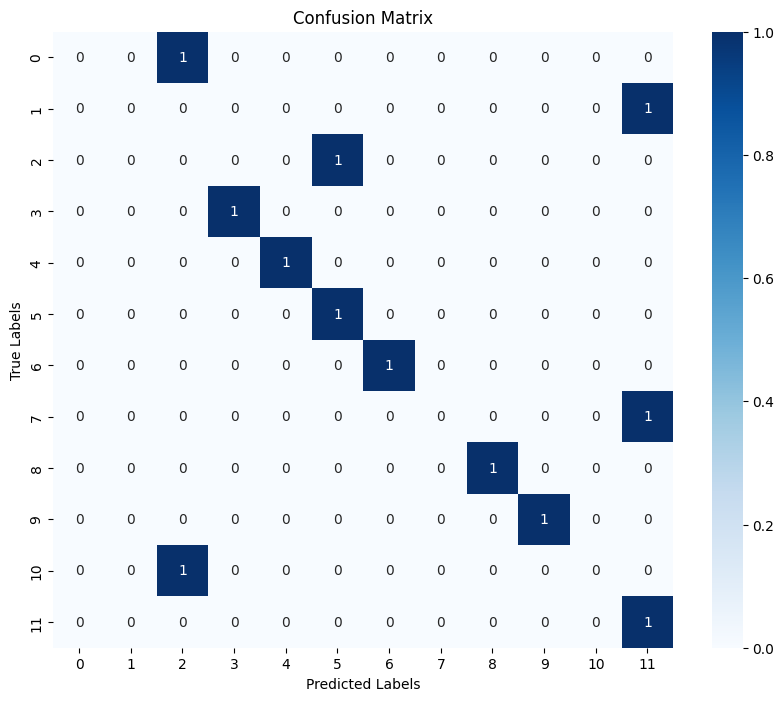

Test Accuracy: 58.33%


(array([[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]]),
 58.333333333333336)

In [ ]:
from torch.utils.data import DataLoader

# Initialize the dataset and dataloaders
train_dataset = FewShotVideoDataset(support_dir=train_support_dir, query_dir=train_query_dir, transform=transform, n_way=12, n_support=3, n_query=1)
test_dataset = FewShotVideoDataset(support_dir=test_support_dir, query_dir=test_query_dir, transform=transform, n_way=12, n_support=3, n_query=1)

train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True)  # batch size of 1 episode
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Initialize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
proto_model = ProtoNet().to(device)

# Training call
train_model(proto_model, train_dataloader, epochs=2, learning_rate=0.001, device=device, n_support=3)

# Evaluation call
evaluate_model(proto_model, test_dataloader, device=device)


In [ ]:
def evaluate_model(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for support_videos, query_videos, support_labels, query_labels in tqdm(dataloader, desc='Evaluation Progress', unit='batch'):
            support_videos = support_videos.to(device)
            query_videos = query_videos.to(device)
            support_labels = support_labels.to(device)
            query_labels = query_labels.to(device)

            support_videos = support_videos.permute(0, 2, 1, 3, 4)  # assuming the second dimension is depth, which needs to come after the batch dimension
            support_videos = support_videos.unsqueeze(2)  # add a singleton channel dimension
            query_videos = query_videos.permute(0, 2, 1, 3, 4)  # the same permutation for the query videos
            query_videos = query_videos.unsqueeze(2)  # add a singleton channel dimension
            support_labels = support_labels.to(device)
            query_labels = query_labels.to(device)

            # Get embeddings
            support_embeddings = model(support_videos.view(-1, *support_videos.size()[2:]))
            query_embeddings = model(query_videos.view(-1, *query_videos.size()[2:]))

            # Compute prototypes
            prototypes = compute_prototypes(support_embeddings, support_labels, num_support=support_videos.size(1))

            # Calculate distances and predictions
            dists = euclidean_dist(query_embeddings, prototypes)
            _, preds = torch.min(dists, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(query_labels.cpu().numpy())

    accuracy = (np.array(all_preds) == np.array(all_labels)).mean() * 100
    print(f'Test Accuracy: {accuracy:.2f}%')
    return accuracy


In [ ]:
def train_model(model, train_dataloader, epochs, learning_rate, device):
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in tqdm(range(epochs), desc='Epochs Progress', unit='epoch'):
        running_loss = 0.0
        for batch in tqdm(train_dataloader, desc=f'Training Progress (Epoch {epoch+1}/{epochs})', unit='batch', leave=False):
            support_videos, query_videos, support_labels, query_labels = batch

            # Assuming the tensors are of shape [batch, sequence, channel, height, width]
            # We want them in the shape [batch, channel, sequence, height, width] before feeding them to the model

            # Squeeze out the singleton dimension if it exists and permute to the correct order
            support_videos = support_videos.squeeze(1).permute(0, 2, 1, 3,4).unsqueeze(1).to(device)
            query_videos = query_videos.squeeze(1).permute(0, 2, 1, 3,4).unsqueeze(1).to(device)

            # Verify the shape
            print(f'Support videos shape after permute: {support_videos.shape}')  # Should be [batch, 1, 15, 224, 224]
            print(f'Query videos shape after permute: {query_videos.shape}')    # Should be [batch, 1, 15, 224, 224]

            support_labels = support_labels.to(device)
            query_labels = query_labels.to(device)

            optimizer.zero_grad()
            support_embeddings = model(support_videos)
            query_embeddings = model(query_videos)

            prototypes = compute_prototypes(support_embeddings, support_labels, n_support=support_videos.size(0) // model.n_way)
            distances = euclidean_dist(query_embeddings, prototypes)
            loss = F.cross_entropy(-distances, query_labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            tqdm.write(f'Batch loss: {loss.item()}')

        epoch_loss = running_loss / len(train_dataloader.dataset)
        tqdm.write(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

    print('Training complete')


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Simple2DCNN(nn.Module):
    def __init__(self, num_classes):
        super(Simple2DCNN, self).__init__()
        # Change the input channels from 3 to 1 for grayscale images
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        # Update the size accordingly if your image size changes after pooling
        self.fc1 = nn.Linear(64 * 56 * 56, 512)  # You need to calculate the correct size here
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1)  # Flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [ ]:
import os
import cv2
import torch
from PIL import Image
from torchvision import transforms

class VideoDataset2D(torch.utils.data.Dataset):
    activity_to_idx = {
        'sitting_still': 0, 'eating': 1, 'fetching_an_object': 2, 'placing_an_object': 3,
        'reading_magazine':4, 'using_multimedia_display':5, 'talking_on_phone': 6, 'writing': 7,
        'pressing_automation_button': 8, 'putting_on_jacket': 9, 'drinking': 10, 'fastening_seat_belt': 11,
        'taking_off_jacket': 12, 'looking_or_moving_around': 13, 'opening_bottle': 14, 'interacting_with_phone': 15,
        'working_on_laptop': 16,'reading_newspaper': 17,
        'closing_bottle': 18, 'opening_laptop': 19
    }

    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.videos = [os.path.join(directory, fname) for fname in sorted(os.listdir(directory)) if fname.endswith('.mp4')]

    def __getitem__(self, idx):
        video_path = self.videos[idx]
        cap = cv2.VideoCapture(video_path)

        frames = []
        try:
            # Read frames until you can't read anymore or you reach the desired number
            while True:
                ret, frame = cap.read()
                if not ret:
                    break  # Reached end of video

                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                frame = Image.fromarray(frame)

                if self.transform:
                    frame = self.transform(frame)

                frames.append(frame)
        finally:
            cap.release()

        # Optionally, select a subset of frames, for example:
        # frames = frames[:self.target_frames]
        # where self.target_frames is defined in __init__ and passed as an argument

        # Stack frames into a tensor
        frames_tensor = torch.stack(frames)

        # Extract activity name and map to index
        video_name = os.path.basename(video_path)
        activity_name = '_'.join(video_name.split('_')[:-1])  # Remove the trailing number
        label_index = self.activity_to_idx[activity_name]

        return frames_tensor, label_index

    def __len__(self):
        return len(self.videos)




In [ ]:
def pad_collate(batch):
    # Find the longest video in the batch
    max_length = max(x[0].shape[0] for x in batch)
    # Pad all videos to the max_length with zeros
    batch = [(torch.nn.functional.pad(video, (0, 0, 0, 0, 0, max_length - video.shape[0])), label) for (video, label) in batch]
    # Stack all
    videos = torch.stack([x[0] for x in batch])
    labels = torch.tensor([x[1] for x in batch])
    return videos, labels

In [ ]:
# For 2D CNN
train_dataset_2d = VideoDataset(directory='/content/train_data', transform=transform, model_type='2DCNN')
test_dataset_2d = VideoDataset(directory='/content/test_data', transform=transform, model_type='2DCNN')

train_loader = DataLoader(train_dataset_2d, batch_size=128, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset_2d, batch_size=128, shuffle=False, num_workers=0)

dataloaders = {
    'train': train_loader,
    'val': test_loader
}

In [ ]:
import time
from tqdm import tqdm
import torch

def train_model_2dcnn(model, dataloaders, criterion, optimizer, num_epochs=25, device=None):
    since = time.time()

    val_acc_history = []
    best_acc = 0.0
    num_classes = 20  # Set this to your actual number of classes
    confusion_matrix_total = torch.zeros(num_classes, num_classes, dtype=torch.int64)

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            # Iterate over data.
            for data in tqdm(dataloaders[phase], desc=f'Epoch {epoch+1} {phase} Progress'):

                inputs, labels = data
                if inputs.dim() != 4:
                    inputs.squeeze()
                    continue
                if not torch.is_tensor(inputs):
                    inputs = torch.tensor(inputs, dtype=torch.float32)
                if not torch.is_tensor(labels):
                    labels = torch.tensor(labels, dtype=torch.long)
                inputs, labels = inputs.to(device), labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)

                    # Backward and optimize if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # Update confusion matrix for each batch
                for t, p in zip(labels.view(-1), preds.view(-1)):
                    confusion_matrix_total[t.long(), p.long()] += 1

            # Epoch statistics
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            if not isinstance(running_corrects, torch.Tensor):
                running_corrects = torch.tensor(running_corrects, dtype=torch.float64)
            epoch_acc = (running_corrects.double() / len(dataloaders[phase].dataset)) * 100

            # Epoch statistics
            #epoch_loss = running_loss / len(dataloaders[phase].dataset)
            # Ensure running_corrects is a tensor before calling .double(), if it's not, convert it
            #if not isinstance(running_corrects, torch.Tensor):
                #running_corrects = torch.tensor(running_corrects, dtype=torch.float64)
            #epoch_acc = (running_corrects.double() / len(dataloaders[phase].dataset)) * 100

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}%')


            # Copy the best model and update validation history
            if phase == 'val':
                val_acc_history.append(epoch_acc)
                if epoch_acc > best_acc:
                    best_acc = epoch_acc

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    return model, val_acc_history, confusion_matrix_total


In [ ]:
import numpy as np
import torch
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model_2dcnn(model, dataloader, criterion, device=None):
    model.eval()  # Set the model to evaluation mode
    running_loss = 0.0
    running_corrects = 0
    all_preds = []
    all_labels = []

    # No gradient needed for evaluation
    with torch.no_grad():
        for inputs, labels in dataloader:

            # Ensure the input tensor is in the correct shape (batch_size, channels, height, width) for 2D CNN
            if inputs.dim() != 4:
                print("Unexpected number of dimensions in the input tensor. Expected 4 dimensions.")
                continue  # Skip this batch if not the correct dimensions

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

            all_preds.extend(preds.view(-1).cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    total_loss = running_loss / len(dataloader.dataset)
    total_acc = running_corrects.double() / len(dataloader.dataset)

    print(f'Loss: {total_loss:.4f} Acc: {total_acc:.4f}')

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    accuracy = accuracy_score(all_labels, all_preds)

    # Plot the confusion matrix
    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show()

    print(f'Accuracy: {accuracy * 100:.2f}%')

    # Return loss and accuracy for further analysis if needed
    return total_loss, total_acc


In [ ]:
num_classes = 20
model = Simple2DCNN(num_classes=num_classes)

# Move the model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu")

model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train and evaluate
trained_model, val_acc_history, confusion_matrix_total = train_model_2dcnn(
    model,
    dataloaders,
    criterion,
    optimizer,
    num_epochs=10,
    device=device
)

test_loss, test_acc = evaluate_model_2dcnn(trained_model, test_loader, criterion, device)

print(f'Test Loss: {test_loss:.4f} Test Acc: {test_acc:.4f}')

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import time
from sklearn.metrics import confusion_matrix, accuracy_score
import numpy as np

class Simple3DCNN(nn.Module):
    def __init__(self, num_classes):
        super(Simple3DCNN, self).__init__()
        self.conv1 = nn.Conv3d(1, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool3d(2)
        self.conv2 = nn.Conv3d(64, 128, kernel_size=3, padding=1)
        # Here you need to adjust the size according to your final output after convolutions
        self.fc1 = nn.Linear(128 * 4 * 56 * 56, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        print("Shape before flatten:", x.shape)
        x = torch.flatten(x, 1)  # Flatten all dimensions except the batch
        print("Shape after flatten:", x.shape)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [ ]:
from torch.utils.data import Dataset, DataLoader
import cv2
import re
from torchvision import transforms
from torchvision.transforms import ToTensor
from torchvision.transforms.functional import to_tensor

def video_transform(video_frames, transform):
    # Ensure transform includes ToTensor() to convert frames to PyTorch tensors
    return [transform(frame) for frame in video_frames]

class VideoDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.videos = [os.path.join(directory, x) for x in os.listdir(directory) if x.endswith('.mp4')]

        # Updated labels extraction with error handling
        self.labels = []
        for x in self.videos:
            match = re.match(r"([a-zA-Z_]+)_\d+", os.path.basename(x))
            if match is not None:
                self.labels.append(match.group(1))
            else:
                # Handle the case where the filename does not match the pattern
                # For example, you can use the whole filename (without extension) as the label
                label = os.path.splitext(os.path.basename(x))[0]
                self.labels.append(label)

        self.label_to_index = {label: index for index, label in enumerate(sorted(set(self.labels)))}

    def __len__(self):
        return len(self.videos)

    def __getitem__(self, idx):
        video_path = self.videos[idx]
        # Load video frames
        frames = self.load_video(video_path)

        # Apply transformation to each frame
        if self.transform is not None:
            frames = [self.transform(frame) for frame in frames]
        else:
            # Convert each frame to tensor manually if no transform is provided
            frames = [to_tensor(frame) for frame in frames]

        # Now frames should be a list of tensors
        frames = torch.stack(frames)  # This should work without TypeError
        label = self.labels[idx]
        return frames, label

    def load_video(self, video_path, target_frames=16):
        cap = cv2.VideoCapture(video_path)
        frames = []
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        frame_indices = np.linspace(0, frame_count - 1, target_frames, dtype=np.int64)

        for frame_idx in range(frame_count):
            ret, frame = cap.read()
            if not ret:
                break
            if frame_idx in frame_indices:
                # Convert frame from BGR to RGB
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                frames.append(frame)

        cap.release()

        # Ensure all frames are converted to tensors
        frames = [transforms.ToTensor()(frame) for frame in frames]

        # If the video is shorter than the target_frames, pad the list of frames
        while len(frames) < target_frames:
            frames.append(torch.zeros_like(frames[0]))

        # Stack into a single tensor
        return torch.stack(frames)

# data loader
train_dataset = VideoDataset(directory='/content/train_data')
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

test_dataset = VideoDataset(directory='/content/test_data')
test_loader = DataLoader(test_dataset, batch_size=4)


In [ ]:
import os
import random
from sklearn.model_selection import KFold
import shutil

# Define the path to the main directory containing activity folders
activities_dir = '/content/drive/My Drive/inner_mirror/clips'

# List of the top 20 activities based on occurrence
top_20_activities = [
    'sitting_still', 'eating', 'fetching_an_object', 'placing_an_object',
    'reading_magazine', 'using_multimedia_display', 'talking_on_phone', 'writing',
    'pressing_automation_button', 'putting_on_jacket', 'drinking', 'fastening_seat_belt',
    'taking_off_jacket', 'looking_or_moving_around', 'opening_bottle', 'interacting_with_phone',
    'working_on_laptop', 'reading_newspaper', 'closing_bottle', 'opening_laptop'
]

# Create lists to hold file paths and labels
file_paths = []
labels = []

# Create lists to hold file paths and labels
file_paths = []
labels = []

# Loop through each activity and collect clips
for activity in top_20_activities:
    activity_folder = os.path.join(activities_dir, activity)
    for clip in os.listdir(activity_folder):
        if clip.endswith('.mp4'):
            file_paths.append(os.path.join(activity_folder, clip))
            labels.append(activity)

# Shuffle the dataset
combined = list(zip(file_paths, labels))
random.shuffle(combined)

# Define K-Folds cross-validator
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True)

# Split the dataset into k consecutive folds for training and validation
for fold, (train_index, test_index) in enumerate(kf.split(combined)):
    # Clear and create directories for the fold
    fold_train_dir = f'/content/train_data_fold_{fold}'
    fold_test_dir = f'/content/test_data_fold_{fold}'
    if os.path.exists(fold_train_dir):
        shutil.rmtree(fold_train_dir)
    if os.path.exists(fold_test_dir):
        shutil.rmtree(fold_test_dir)
    os.makedirs(fold_train_dir)
    os.makedirs(fold_test_dir)

    # Split the data and labels into training and testing for the current fold
    train_files = [combined[i] for i in train_index]
    test_files = [combined[i] for i in test_index]

    # Copy files to the respective fold directory
    for train_file, _ in train_files:
        shutil.copy(train_file, os.path.join(fold_train_dir, os.path.basename(train_file)))
    for test_file, _ in test_files:
        shutil.copy(test_file, os.path.join(fold_test_dir, os.path.basename(test_file)))

    print(f"Fold {fold} prepared with {len(train_files)} training and {len(test_files)} testing files.")